In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


First, download the dataset from the following link as .zip file:

https://academictorrents.com/details/7a638ed187a6180fd6e464b3666a6ea0499af4af

Then, extract the zip file into a folder. You can then upload this dataset to your google drive folder or use it on any platform you want.

For more information about dataset, you can see this article:
The Article: https://arxiv.org/abs/1912.12142


## Downloading and Saving Dataset

In [21]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow
import keras
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
from keras.utils import to_categorical
from tensorflow.keras import Sequential
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import legacy, optimizers

In [ ]:
# import os
# import pandas as pd
# import numpy as np
# from PIL import Image
# import matplotlib.pyplot as plt
# import keras

# # Replace these paths with the actual paths to your dataset folders
# data_dir = '/content/drive/MyDrive/Deep_Learning/lung_colon_image_set/'
# filepaths = []
# image_data = []
# labels = []


# folds = os.listdir(data_dir)

# for fold in folds:
#     foldpath = os.path.join(data_dir, fold)
#     flist = os.listdir(foldpath)

#     for f in flist:
#         f_path = os.path.join(foldpath , f)
#         filelist = os.listdir(f_path)

#         for file in filelist:
#             fpath = os.path.join(f_path , file)
#             try:
#               # Open the image using PIL (or you can use OpenCV) within a 'with' statement
#               with Image.open(fpath) as image:
#                 if image is not None:
#                   # Resize images
#                   im = image.resize((120,120), Image.LANCZOS)
#                   # Append image and label to respective lists
#                   image_data.append(np.array(im))
#                 else:
#                   print(f"Error opening image '{fpath}': NoneType object returned")
#             except Exception as e:
#               print(f"Error opening image '{fpath}': {e}")
#             # Assign the label of the images according to the folder they belongs to.
#             if f == 'colon_aca':
#                 labels.append('Colon adenocarcinoma')

#             elif f == 'colon_n':
#                 labels.append('Colon Benign Tissue')

#             elif f == 'lung_aca':
#                 labels.append('Lung adenocarcinoma')

#             elif f == 'lung_n':
#                 labels.append('Lung Benign Tissue')

#             elif f == 'lung_scc':
#                 labels.append('Lung Squamous Cell Carcinoma')

# tr_labels = np.array(labels)
# image_matrix = np.array([np.array(img) for img in image_data])

# np.save("/content/drive/MyDrive/Deep_Learning_Spring24/Assignment/data120.npy",image_matrix)
# np.save("/content/drive/MyDrive/Deep_Learning_Spring24/Assignment/labels120.npy",tr_labels)


Once you have saved the data and labels into a folder, you can call them from the related folder and use them in any way you want.

#Call data from directory

In [22]:
# loading the numpy files....
try:
    print('loading data...')
    data = np.load("/content/drive/My Drive/deep_learning/project/data120.npy")
    labels = np.load("/content/drive/My Drive/deep_learning/project/labels120.npy")
    print(labels)
except Exception as e:
    print("Error:", e)


print(f'Number of Classes = {len(np.unique(labels))}')
print(data.shape)
print(labels.shape)

loading data...
['Lung adenocarcinoma' 'Lung adenocarcinoma' 'Lung adenocarcinoma' ...
 'Colon adenocarcinoma' 'Colon adenocarcinoma' 'Colon adenocarcinoma']
The number of classes is = 5
(25000, 120, 120, 3)
(25000,)


# EDA


In [ ]:
labels_ex = np.unique(labels)
for i in labels_ex:
  print(i)

Colon Benign Tissue
Colon adenocarcinoma
Lung Benign Tissue
Lung Squamous Cell Carcinoma
Lung adenocarcinoma


## Applying OneHotEncoder to the target variable

In [23]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Convert labels to integers in order to transform them into one-hot encoded format
integer_labels = label_encoder.fit_transform(labels)

# Converting them into categorical( correct input for CNN)
one_hot_labels = to_categorical(integer_labels)

print(f'The new one-hot encoded labels are:\n {one_hot_labels}')
print(one_hot_labels.shape)


The new one-hot encoded labels are:
 [[0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 ...
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]]
(25000, 5)


## Visualizing Sample Images

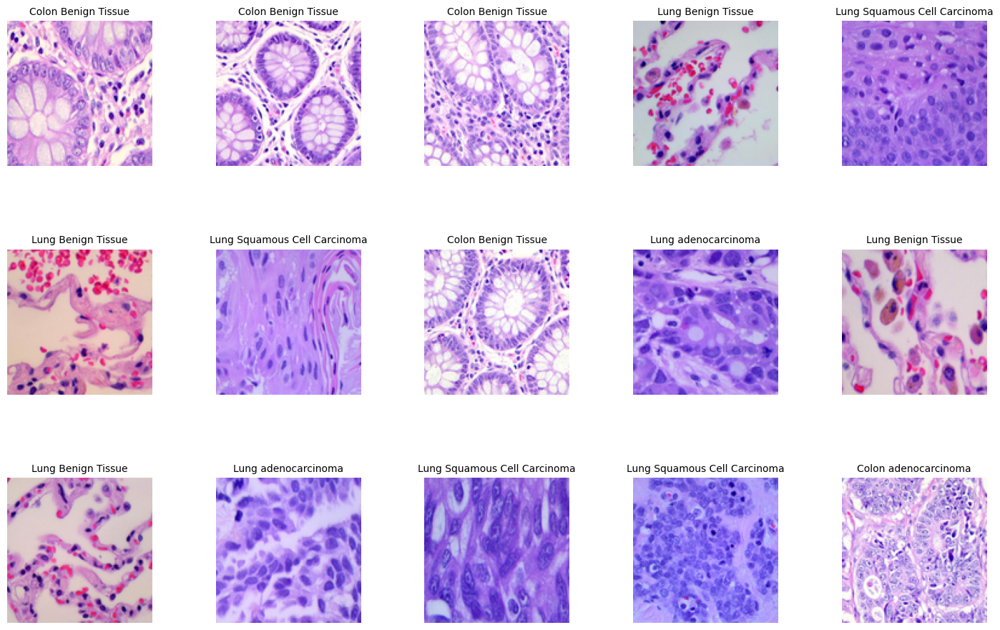

In [ ]:
# Randomly select 15 samples to interpret
indices = np.random.choice(len(data), size=15, replace=False)

# Create a figure with subplots in order to fit all the images
fig, axes = plt.subplots(3, 5, figsize=(15, 10))
fig.tight_layout(pad=3.0)

# Loop for plotting the images with the imshow()
for i, idx in enumerate(indices):
    ax = axes[i // 5, i % 5]
    ax.imshow(data[idx])
    ax.set_title(labels[idx], fontsize=10)
    ax.axis('off')

plt.show()

## Visualizing Class Distribution

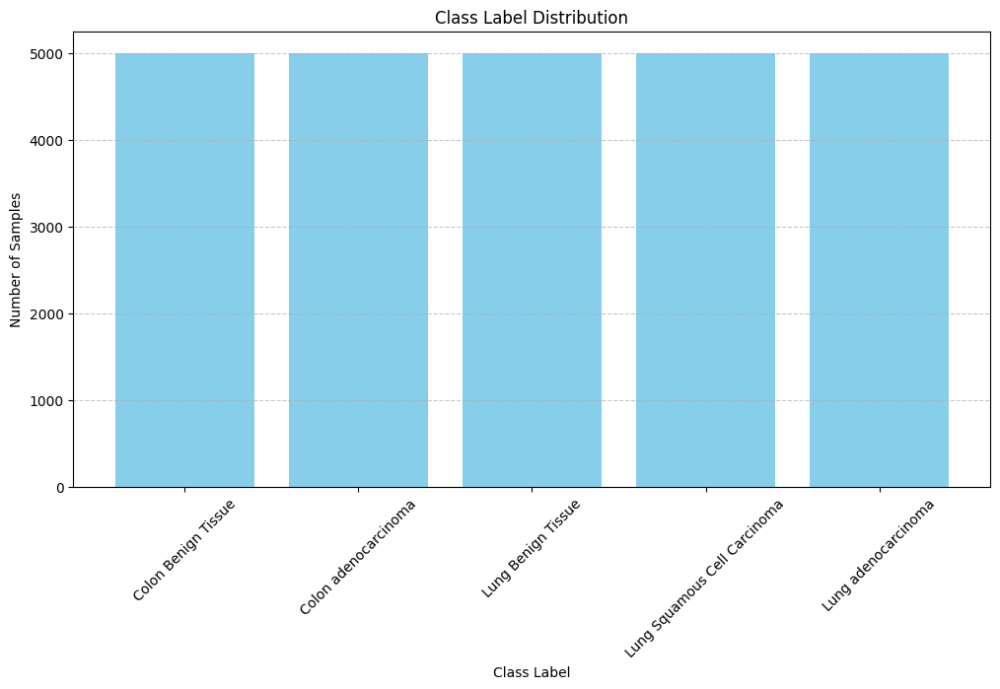

In [13]:
# Get the unique class labels and their counts
unique_labels, counts = np.unique(labels, return_counts=True)

# Create a bar plot
plt.figure(figsize=(12, 6))
plt.bar(unique_labels, counts, color='skyblue')
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')
plt.title('Class Label Distribution')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.savefig('/content/drive/My Drive/deep_learning/project/class_label_distribution.png')
plt.show()

##Data Splitting

In [24]:
# Training = 80%, Validation = 20%, Test = 20%
X_train_val, X_test, y_train_val, y_test = train_test_split(data, one_hot_labels, test_size=0.2, stratify= one_hot_labels, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, stratify=y_train_val, random_state=42)

# Duble check
print("Train set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)
print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)



Train set shape: (15000, 120, 120, 3) (15000, 5)
Validation set shape: (5000, 120, 120, 3) (5000, 5)
Test set shape: (5000, 120, 120, 3) (5000, 5)
X_train shape: (15000, 120, 120, 3)
X_val shape: (5000, 120, 120, 3)
X_test shape: (5000, 120, 120, 3)


# Evaluation Functions

Since you will use the same evaluation functions several times ( to evaluate the baseline, enhanced and transfer learning models), it is better to prepare the standardized functions to calculate them each time in the same way.

In [25]:
def plot_roc_curve(model, X_test, y_test):
    y_pred_proba = model.predict(X_test)
    fpr_micro, tpr_micro, _ = roc_curve(y_test.ravel(), y_pred_proba.ravel())
    roc_auc_micro = auc(fpr_micro, tpr_micro)

    plt.figure(figsize=(10, 8))
    plt.plot(fpr_micro, tpr_micro, label=f'Micro-average (AUC = {roc_auc_micro:.2f})', color='deeppink', linestyle=':')

    for i in range(y_test.shape[1]):
        fpr, tpr, _ = roc_curve(y_test[:,i], y_pred_proba[:,i])
        auc_score = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {auc_score:.2f})')

    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.show()


In [26]:
# All in one function
def generate_model_report(model, history, X_test, y_test, target_names):
    # Model Summary
    print("Model Summary:")
    model.summary()

    # Plot training history
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()

    # Evaluation metrics
    print("\nEvaluation Metrics:")
    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    print(f'Test Loss: {test_loss:.4f}')
    print(f'Test Accuracy: {test_accuracy:.4f}')

    # Classification report
    print("\nClassification Report:")
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    print(classification_report(np.argmax(y_test, axis=1), y_pred_classes, target_names=target_names))

    # Confusion matrix
    print("\nConfusion Matrix:")
    cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=target_names, yticklabels=target_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()
    #ROC curve
    print('ROC')
    plot_roc_curve(model, X_test, y_test)


In [27]:
class_names = ['Colon Benign Tissue', 'Colon adenocarcinoma',
               'Lung Benign Tissue', 'Lung Squamous Cell Carcinoma',
               'Lung adenocarcinoma']

# Baseline Model

In [28]:
num_classes = 5
input_shape = (120,120,3)
def create_baseline_cnn(input_shape, num_classes):
    model = models.Sequential()
    model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))
    return model

epochs = 10
batch_size = 32
model = create_baseline_cnn(input_shape, num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


history = model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_data =(X_val,y_val))

test_loss, test_accuracy = model.evaluate(X_test, y_test)

print(f'Test Loss : {test_loss}')
print(f'Test Accuracy : {test_accuracy}')



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 60, 60, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 64)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 57600)             0         
                                                                 
 dense_4 (Dense)             (None, 128)              

# Performance scores for baseline model

## Performance scores on validation set

Model Summary:
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 60, 60, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 64)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 57600)             0         
                                                                 
 dense_4 (Dense)             (None, 128

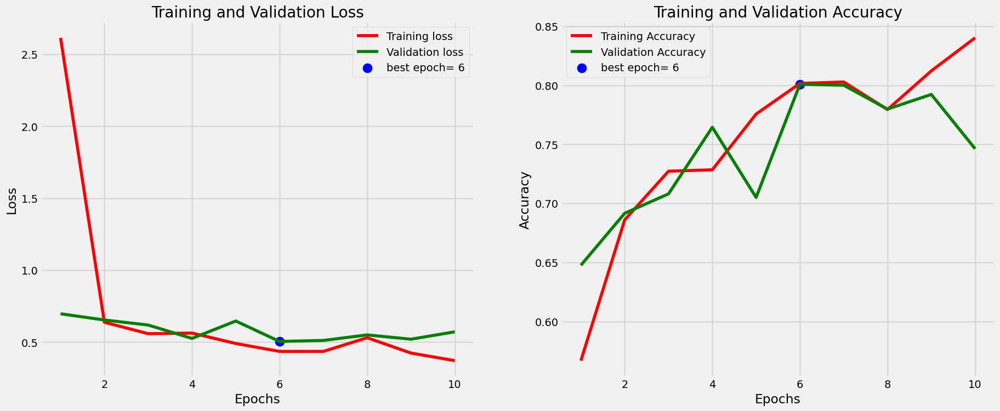


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.5718 - accuracy: 0.7462
Test Loss: 0.5718
Test Accuracy: 0.7462

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.84      0.44      0.58      1000
        Colon adenocarcinoma       0.60      0.85      0.70      1000
          Lung Benign Tissue       0.97      0.97      0.97      1000
Lung Squamous Cell Carcinoma       0.67      0.94      0.78      1000
         Lung adenocarcinoma       0.81      0.53      0.64      1000

                    accuracy                           0.75      5000
                   macro avg       0.78      0.75      0.73      5000
                weighted avg       0.78      0.75      0.73      5000


Confusion Matrix:


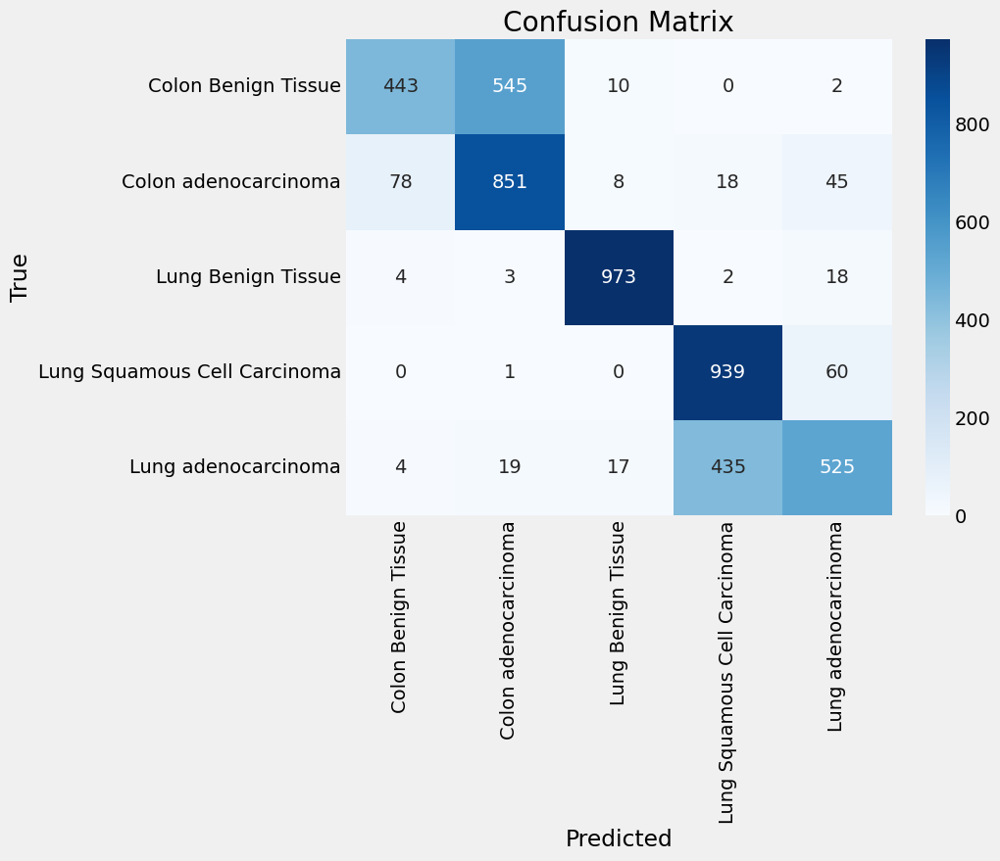

ROC
157/157 [==============================] - 1s 3ms/step


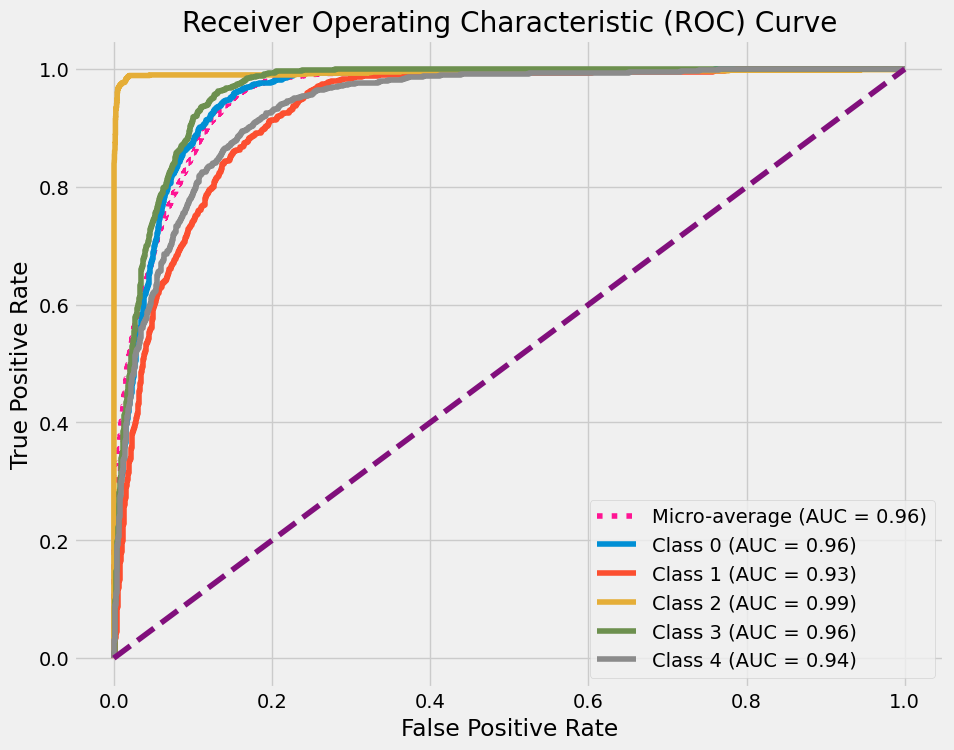

In [29]:
generate_model_report(model,history = history, X_test=X_val, y_test=y_val, target_names= class_names)


In [30]:
test_loss, test_acc = model.evaluate(X_val, y_val)
print(test_acc)
print(test_loss)

157/157 [==============================] - 1s 4ms/step - loss: 0.5718 - accuracy: 0.7462
0.7462000250816345
0.5717676281929016


In [31]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print(test_acc)
print(test_loss)

157/157 [==============================] - 1s 4ms/step - loss: 0.5993 - accuracy: 0.7398
0.739799976348877
0.599297046661377


In [32]:
class_names = ['Colon Benign Tissue', 'Colon adenocarcinoma',
               'Lung Benign Tissue', 'Lung Squamous Cell Carcinoma',
               'Lung adenocarcinoma']

## Performance scores on the Test set

Model Summary:
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 60, 60, 128)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 64)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 57600)             0         
                                                                 
 dense_4 (Dense)             (None, 128

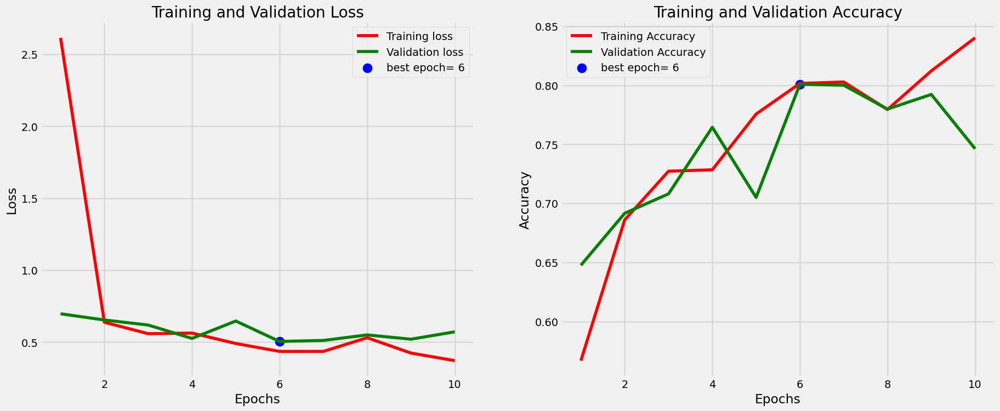


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.5993 - accuracy: 0.7398
Test Loss: 0.5993
Test Accuracy: 0.7398

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.83      0.43      0.56      1000
        Colon adenocarcinoma       0.59      0.86      0.70      1000
          Lung Benign Tissue       0.96      0.96      0.96      1000
Lung Squamous Cell Carcinoma       0.67      0.94      0.78      1000
         Lung adenocarcinoma       0.80      0.52      0.63      1000

                    accuracy                           0.74      5000
                   macro avg       0.77      0.74      0.73      5000
                weighted avg       0.77      0.74      0.73      5000


Confusion Matrix:


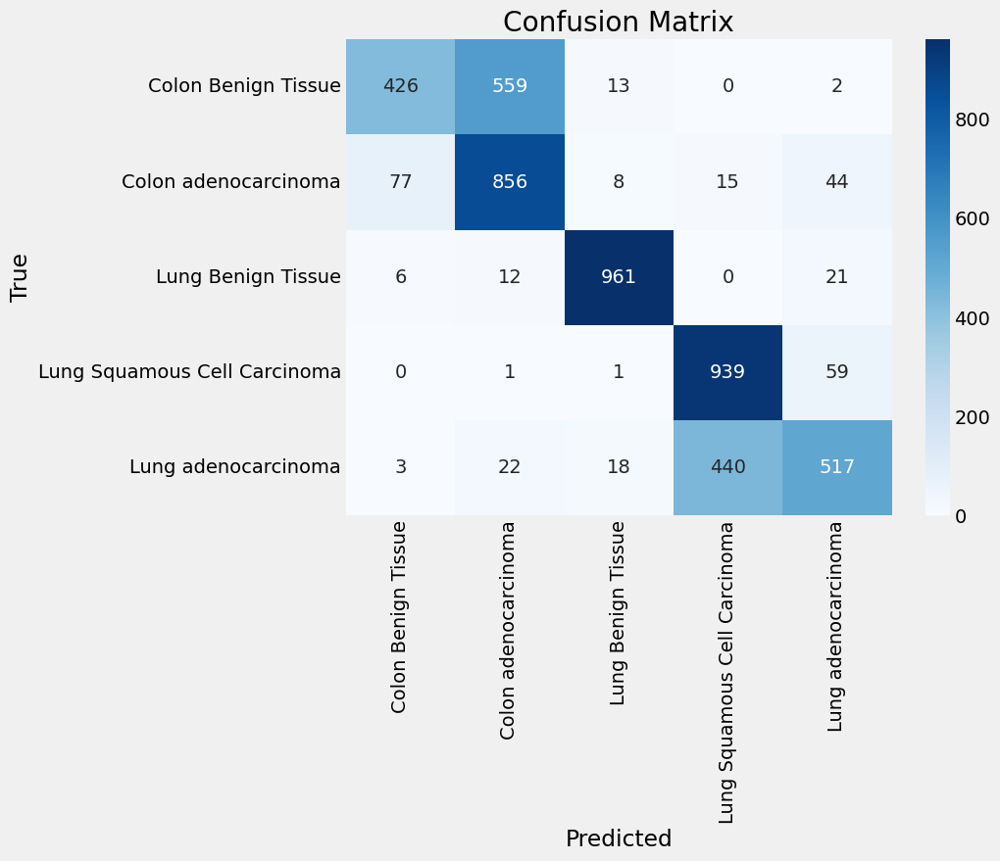

ROC
157/157 [==============================] - 1s 3ms/step


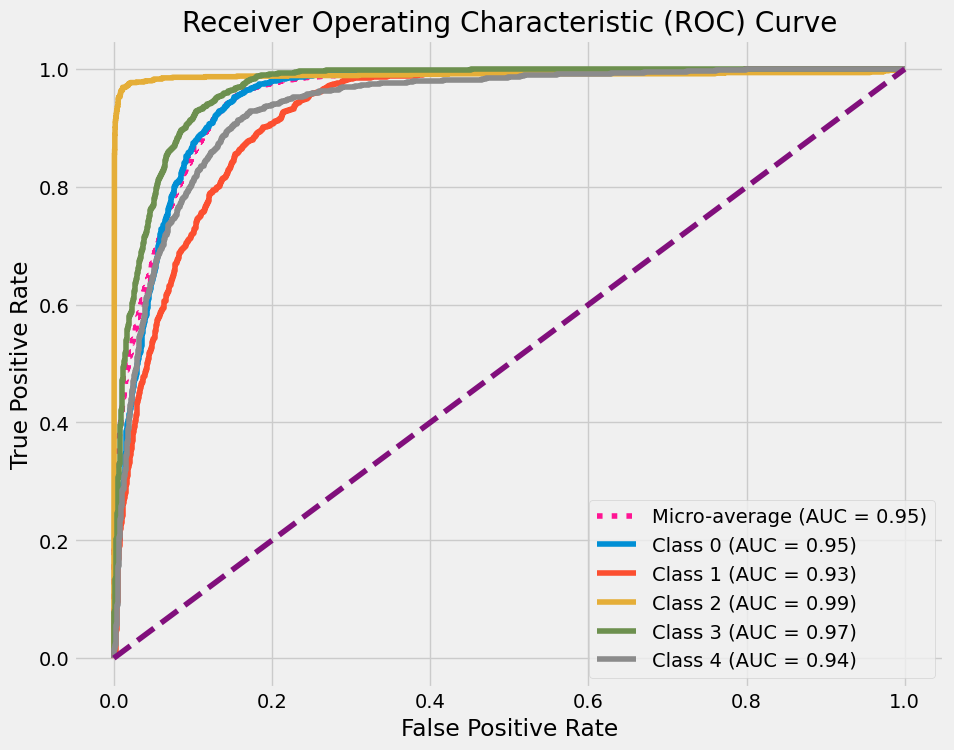

In [33]:
generate_model_report(model,history = history, X_test=X_test, y_test=y_test, target_names= class_names)


# Enhanced Model

# Drop out 20%

Drop out scores are very low, so we will not use this parameter at all

Epoch 1/10
469/469 [==============================] - 8s 14ms/step - loss: 4.3261 - accuracy: 0.5601 - val_loss: 0.6198 - val_accuracy: 0.6950
Epoch 2/10
469/469 [==============================] - 6s 12ms/step - loss: 0.6977 - accuracy: 0.6635 - val_loss: 0.5887 - val_accuracy: 0.7110
Epoch 3/10
469/469 [==============================] - 6s 12ms/step - loss: 0.5513 - accuracy: 0.7271 - val_loss: 0.5481 - val_accuracy: 0.7492
Epoch 4/10
469/469 [==============================] - 6s 12ms/step - loss: 0.5212 - accuracy: 0.7412 - val_loss: 0.5771 - val_accuracy: 0.7008
Epoch 5/10
469/469 [==============================] - 6s 12ms/step - loss: 0.4775 - accuracy: 0.7770 - val_loss: 0.6913 - val_accuracy: 0.7142
Epoch 6/10
469/469 [==============================] - 6s 12ms/step - loss: 0.5057 - accuracy: 0.7662 - val_loss: 0.5676 - val_accuracy: 0.7528
Epoch 7/10
469/469 [==============================] - 6s 12ms/step - loss: 0.4112 - accuracy: 0.8115 - val_loss: 0.4885 - val_accuracy: 0.7924

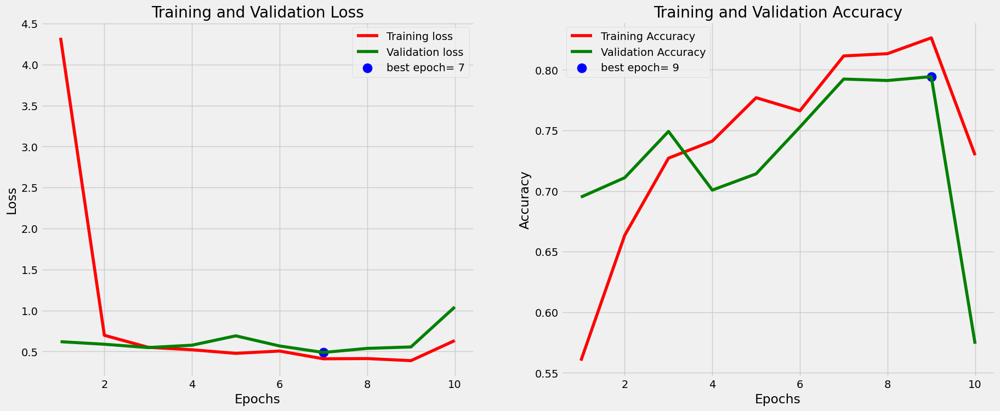


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 1.0432 - accuracy: 0.5740
Test Loss: 1.0432
Test Accuracy: 0.5740

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.00      0.00      0.00      1000
        Colon adenocarcinoma       0.43      0.93      0.59      1000
          Lung Benign Tissue       0.96      0.92      0.94      1000
Lung Squamous Cell Carcinoma       0.58      0.47      0.52      1000
         Lung adenocarcinoma       0.51      0.55      0.53      1000

                    accuracy                           0.57      5000
                   macro avg       0.50      0.57      0.52      5000
                weighted avg       0.50      0.57      0.52      5000


Confusion Matrix:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


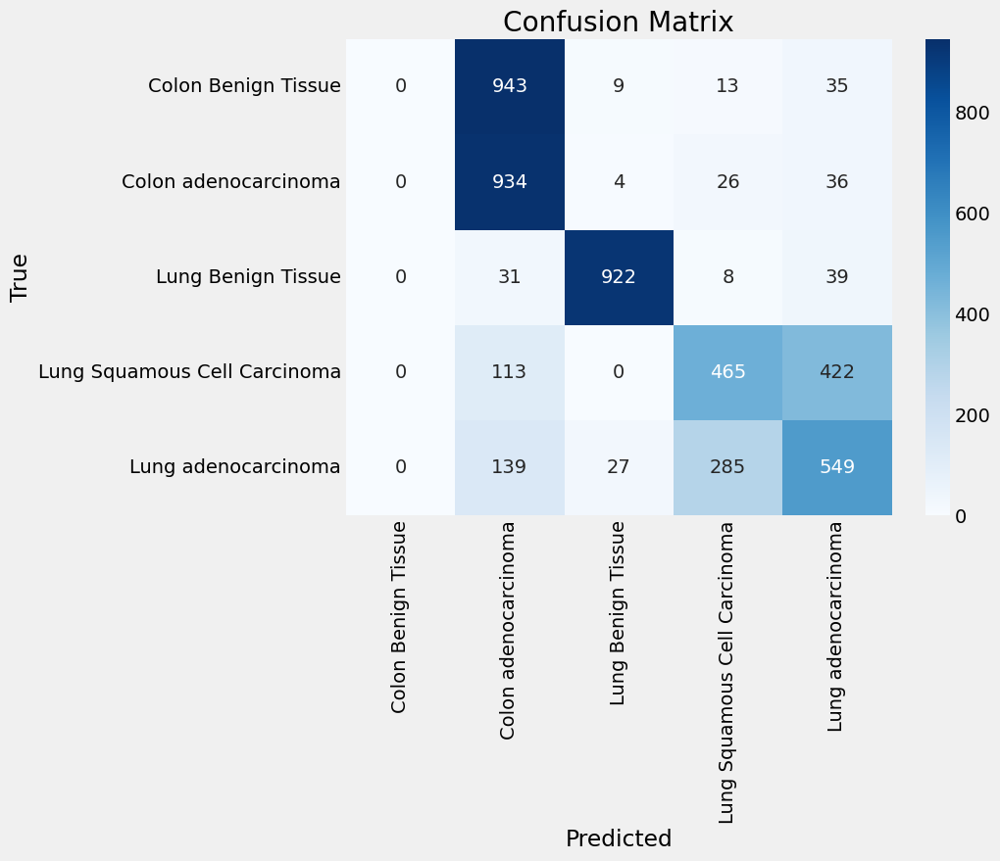

ROC
157/157 [==============================] - 1s 3ms/step


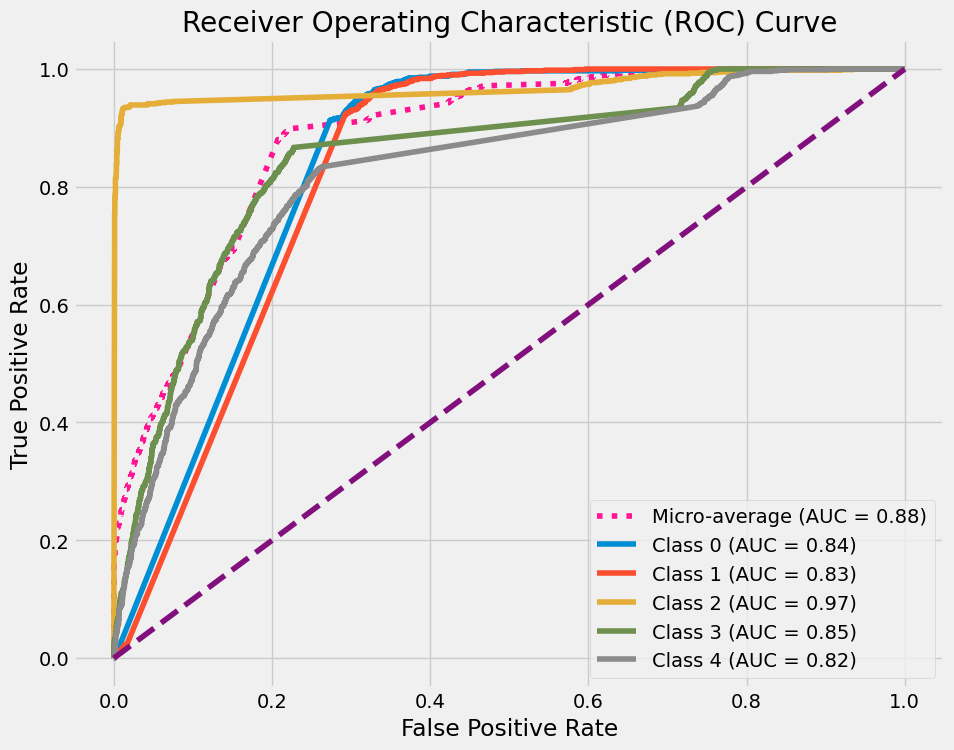

In [34]:
num_classes = 5
input_shape = (120,120,3)
def create_model_drop(input_shape, num_classes):
    model_drop = models.Sequential()
    model_drop.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_drop.add(layers.Dropout(0,2))
    model_drop.add(layers.MaxPooling2D((2, 2)))
    model_drop.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model_drop.add(layers.Dropout(0,2))
    model_drop.add(layers.MaxPooling2D((2, 2)))
    model_drop.add(layers.Flatten())
    model_drop.add(layers.Dense(128, activation='relu'))
    model_drop.add(layers.Dense(32, activation='relu'))
    model_drop.add(layers.Dense(num_classes, activation='softmax'))
    return model_drop

epochs = 10
batch_size = 32
model_drop = create_model_drop(input_shape, num_classes)
model_drop.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history_drop = model_drop.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_data =(X_val,y_val))

test_loss_drop, test_accuracy_drop = model_drop.evaluate(X_test, y_test)

print(f'Test Loss : {test_loss_drop}')
print(f'Test Accuracy : {test_accuracy_drop}')
# Display model summary
generate_model_report(model_drop, history = history_drop, X_test=X_val, y_test=y_val, target_names= class_names)


# **Optimizers tunning with learning rate 0,001**

In [ ]:
# Create the model with an inner if statement which will connect to the loop in order to summarize all together
def create_model_optimizer(input_shape, num_classes, optimizer='adam', learning_rate=0.001):
    model_opt = models.Sequential()
    model_opt.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_opt.add(layers.MaxPooling2D((2, 2)))
    model_opt.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model_opt.add(layers.MaxPooling2D((2, 2)))
    model_opt.add(layers.Flatten())
    model_opt.add(layers.Dense(128, activation='relu'))
    model_opt.add(layers.Dense(32, activation='relu'))
    model_opt.add(layers.Dense(num_classes, activation='softmax'))
# Three different optimizers
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adamax':
        opt = Adamax(learning_rate=learning_rate)
    else:
        raise ValueError("Invalid optimizer choice. Supported optimizers are 'adam', 'rmsprop', 'sgd', and 'adamax'.")

    model_opt.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model_opt


In [ ]:

optimizers = ['adam', 'rmsprop',  'adamax']
optimizer_names = ['Adam', 'RMSprop',  'Adamax']
colors = ['r', 'g',  'm']

# Initialize lists to store training histories
histories_opt = []

# Create models for each optimizer and train
for opt_name, opt in zip(optimizer_names, optimizers):
    model_opt = create_model_optimizer(input_shape, num_classes, optimizer=opt, learning_rate=0.001)
    history_opt = model_opt.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=1)
    histories_opt.append((opt_name, history_opt))



Epoch 1/10
469/469 [==============================] - 8s 13ms/step - loss: 4.3926 - accuracy: 0.3705 - val_loss: 1.0300 - val_accuracy: 0.5278
Epoch 2/10
469/469 [==============================] - 6s 12ms/step - loss: 0.9827 - accuracy: 0.5375 - val_loss: 0.8766 - val_accuracy: 0.5938
Epoch 3/10
469/469 [==============================] - 6s 12ms/step - loss: 0.9605 - accuracy: 0.5567 - val_loss: 0.8969 - val_accuracy: 0.5524
Epoch 4/10
469/469 [==============================] - 6s 12ms/step - loss: 0.8703 - accuracy: 0.5909 - val_loss: 0.8605 - val_accuracy: 0.5858
Epoch 5/10
469/469 [==============================] - 6s 12ms/step - loss: 0.8433 - accuracy: 0.6103 - val_loss: 0.8390 - val_accuracy: 0.5912
Epoch 6/10
469/469 [==============================] - 6s 12ms/step - loss: 0.7952 - accuracy: 0.6338 - val_loss: 0.7438 - val_accuracy: 0.6544
Epoch 7/10
469/469 [==============================] - 6s 12ms/step - loss: 1.1328 - accuracy: 0.4951 - val_loss: 1.0315 - val_accuracy: 0.5196

In [ ]:
# Print accuracy for each optimizer
for opt_name, history in zip(optimizer_names, histories_opt):
    val_accuracy = history[1].history['val_accuracy'][-1]  #
    print(f'{opt_name} Validation Accuracy: {val_accuracy}')

Adam Validation Accuracy: 0.5672000050544739
RMSprop Validation Accuracy: 0.803600013256073
Adamax Validation Accuracy: 0.8464000225067139


Model Summary:
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_12 (Flatten)        (None, 57600)             0         
                                                                 
 dense_36 (Dense)            (None, 12

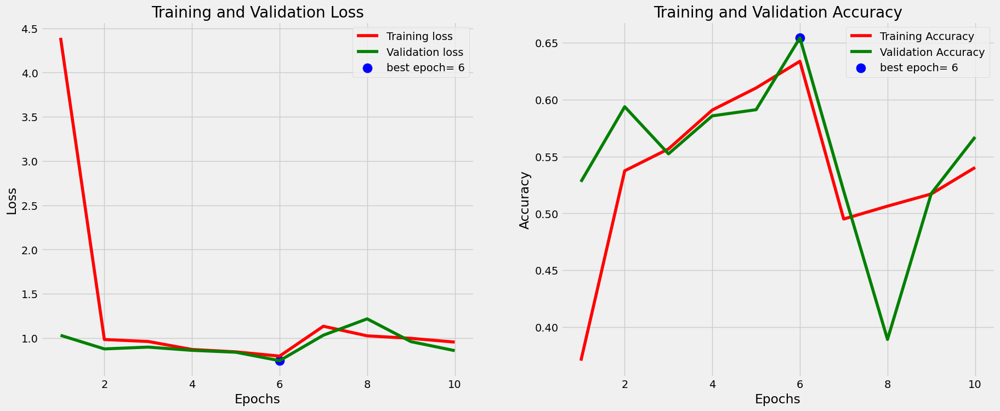


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.5641 - accuracy: 0.8464
Test Loss: 0.5641
Test Accuracy: 0.8464

Classification Report:
157/157 [==============================] - 0s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.76      0.89      0.82      1000
        Colon adenocarcinoma       0.80      0.72      0.76      1000
          Lung Benign Tissue       0.97      0.99      0.98      1000
Lung Squamous Cell Carcinoma       0.88      0.82      0.85      1000
         Lung adenocarcinoma       0.83      0.81      0.82      1000

                    accuracy                           0.85      5000
                   macro avg       0.85      0.85      0.85      5000
                weighted avg       0.85      0.85      0.85      5000


Confusion Matrix:


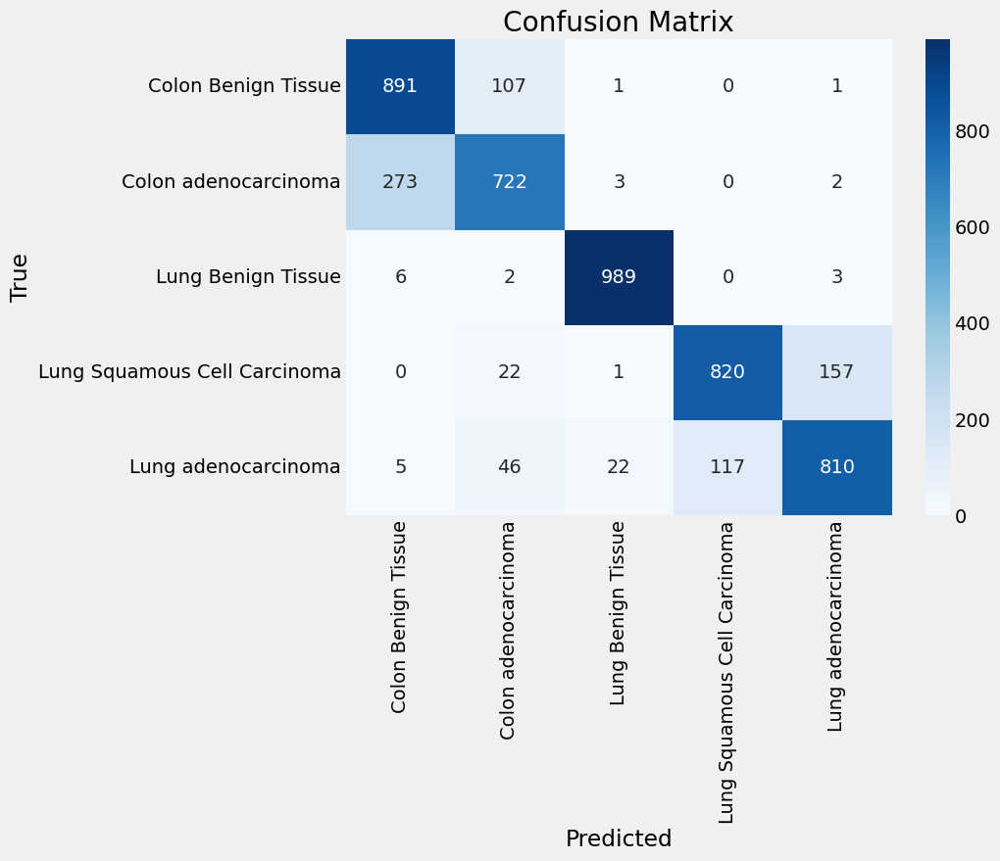

ROC
157/157 [==============================] - 0s 3ms/step


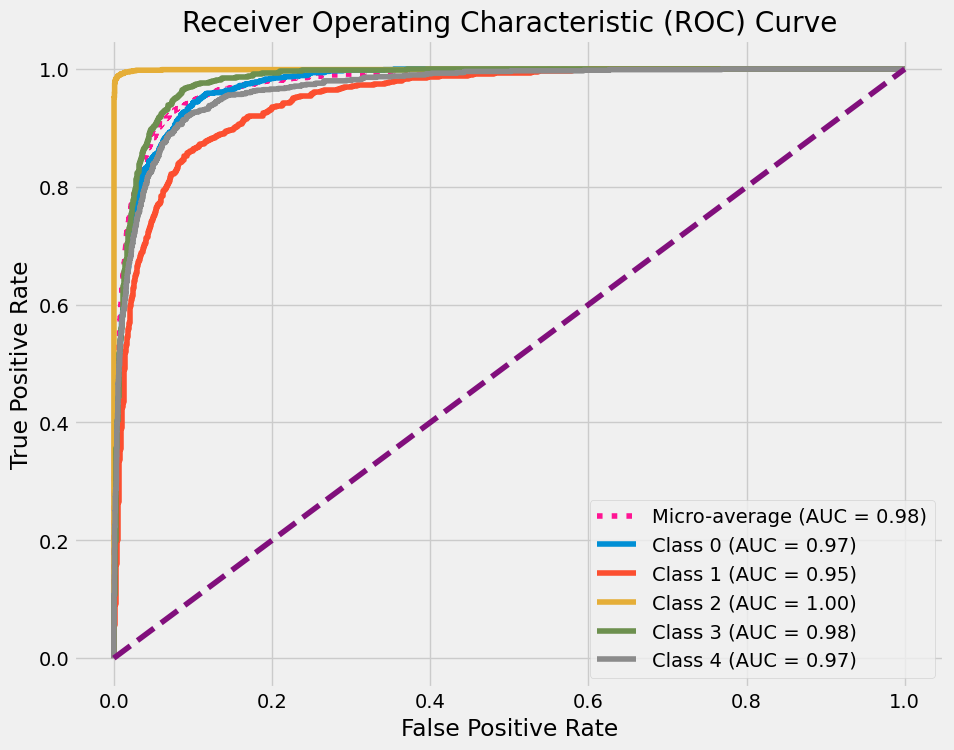

Model Summary:
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_12 (Flatten)        (None, 57600)             0         
                                                                 
 dense_36 (Dense)            (None, 12

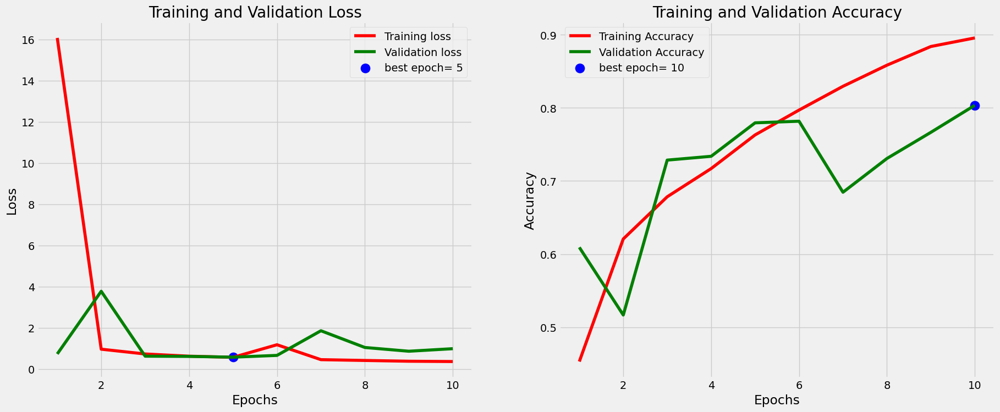


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.5641 - accuracy: 0.8464
Test Loss: 0.5641
Test Accuracy: 0.8464

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.76      0.89      0.82      1000
        Colon adenocarcinoma       0.80      0.72      0.76      1000
          Lung Benign Tissue       0.97      0.99      0.98      1000
Lung Squamous Cell Carcinoma       0.88      0.82      0.85      1000
         Lung adenocarcinoma       0.83      0.81      0.82      1000

                    accuracy                           0.85      5000
                   macro avg       0.85      0.85      0.85      5000
                weighted avg       0.85      0.85      0.85      5000


Confusion Matrix:


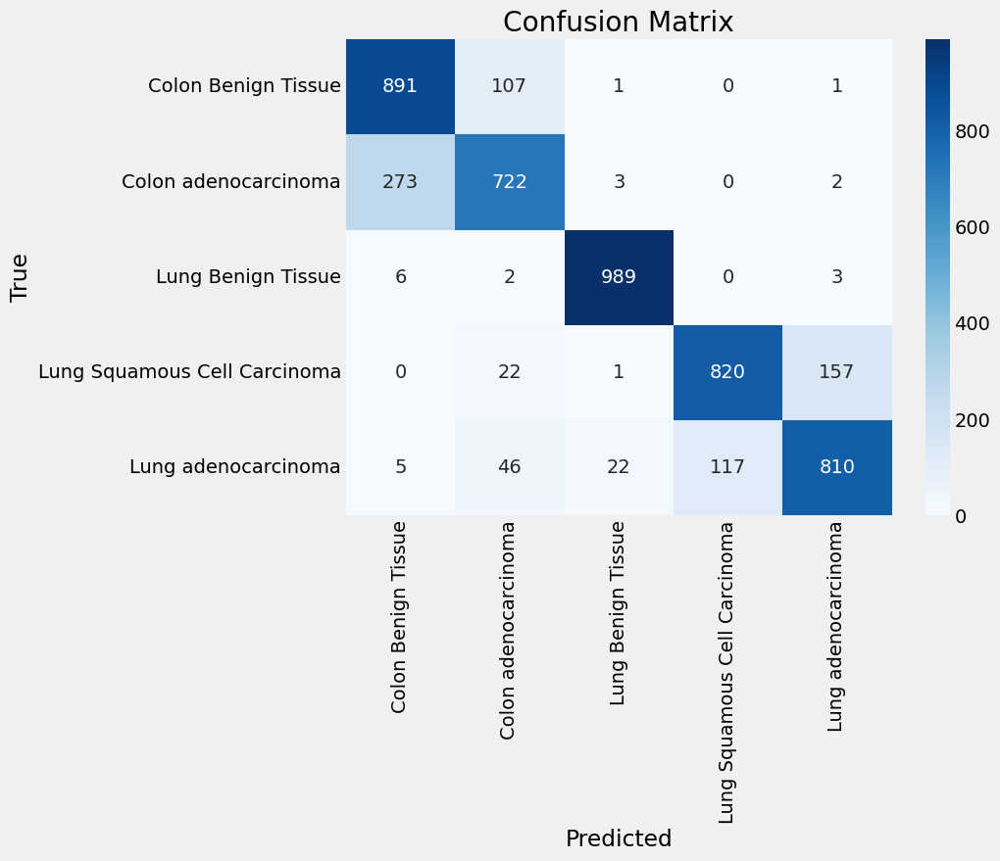

ROC
157/157 [==============================] - 1s 3ms/step


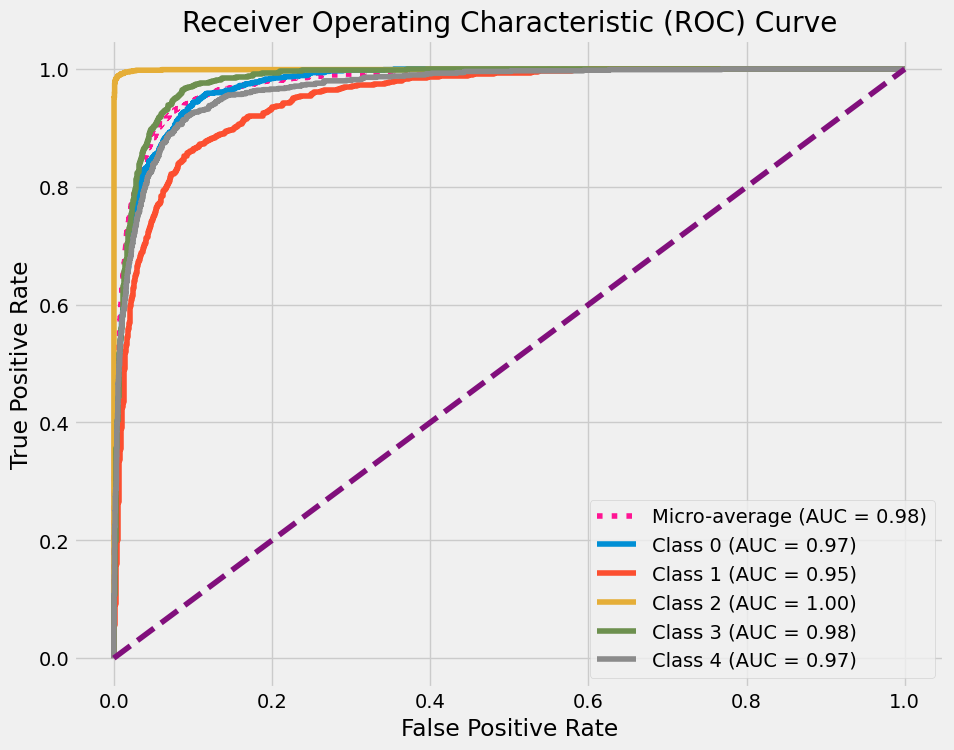

Model Summary:
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_12 (Flatten)        (None, 57600)             0         
                                                                 
 dense_36 (Dense)            (None, 12

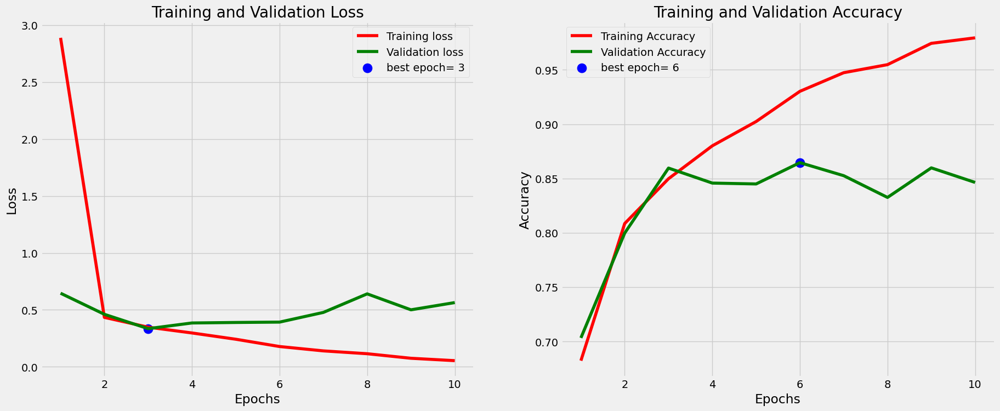


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.5641 - accuracy: 0.8464
Test Loss: 0.5641
Test Accuracy: 0.8464

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.76      0.89      0.82      1000
        Colon adenocarcinoma       0.80      0.72      0.76      1000
          Lung Benign Tissue       0.97      0.99      0.98      1000
Lung Squamous Cell Carcinoma       0.88      0.82      0.85      1000
         Lung adenocarcinoma       0.83      0.81      0.82      1000

                    accuracy                           0.85      5000
                   macro avg       0.85      0.85      0.85      5000
                weighted avg       0.85      0.85      0.85      5000


Confusion Matrix:


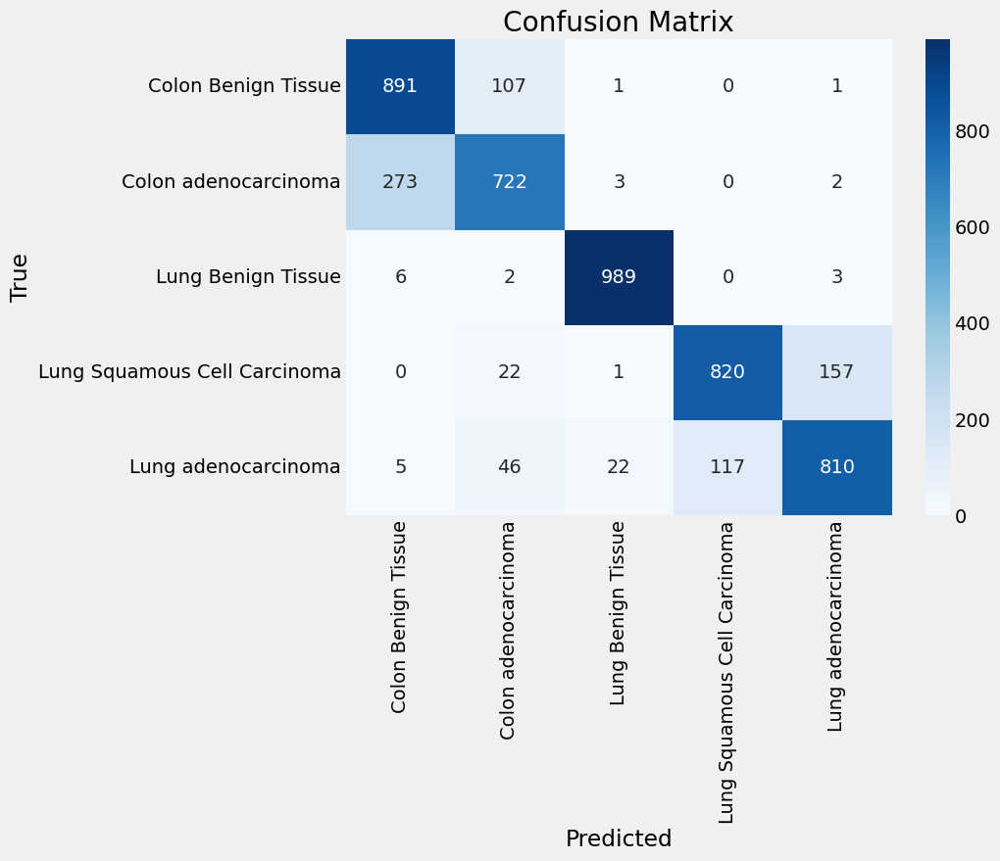

ROC
157/157 [==============================] - 1s 3ms/step


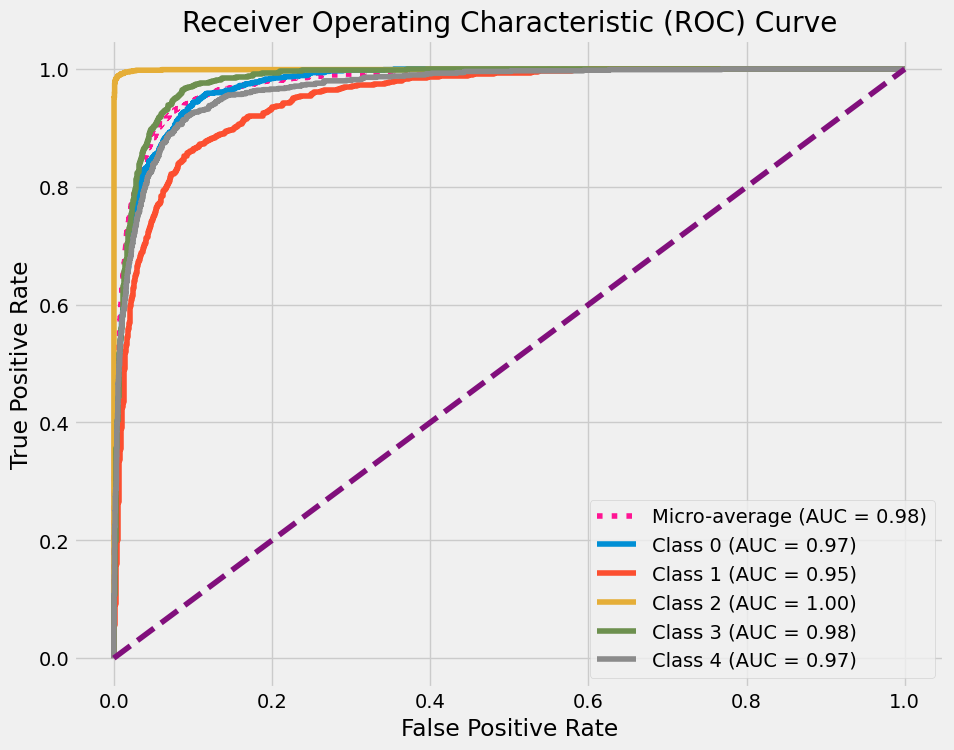

In [208]:
for opt, history in histories_opt:
    generate_model_report(model_opt, history, X_val, y_val, target_names=class_names)

# **Optimizers tunning with learning rate 0,0006**

In [ ]:
# Same as before but now with a much smaller learning rate which proved much more efficient
optimizers = ['adam', 'rmsprop',  'adamax']
optimizer_names = ['Adam', 'RMSprop',  'Adamax']
colors = ['r', 'g',  'm']

# Initialize lists to store training histories
histories_opt2 = []

# Create models for each optimizer and train them
for opt_name, opt in zip(optimizer_names, optimizers):
    model_opt2 = create_model_optimizer(input_shape, num_classes, optimizer=opt, learning_rate=0.0006)
    history_opt2 = model_opt2.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=1)
    histories_opt2.append((opt_name, history_opt2))



Epoch 1/10
469/469 [==============================] - 8s 13ms/step - loss: 3.3069 - accuracy: 0.6690 - val_loss: 0.7405 - val_accuracy: 0.6510
Epoch 2/10
469/469 [==============================] - 6s 12ms/step - loss: 0.5367 - accuracy: 0.7452 - val_loss: 0.5693 - val_accuracy: 0.7410
Epoch 3/10
469/469 [==============================] - 6s 12ms/step - loss: 0.3947 - accuracy: 0.8230 - val_loss: 0.4256 - val_accuracy: 0.8168
Epoch 4/10
469/469 [==============================] - 6s 12ms/step - loss: 0.2985 - accuracy: 0.8787 - val_loss: 0.4150 - val_accuracy: 0.8258
Epoch 5/10
469/469 [==============================] - 6s 12ms/step - loss: 0.2224 - accuracy: 0.9121 - val_loss: 0.4926 - val_accuracy: 0.7894
Epoch 6/10
469/469 [==============================] - 6s 12ms/step - loss: 0.1726 - accuracy: 0.9345 - val_loss: 0.5102 - val_accuracy: 0.8264
Epoch 7/10
469/469 [==============================] - 6s 12ms/step - loss: 0.1299 - accuracy: 0.9525 - val_loss: 0.6136 - val_accuracy: 0.8124

In [ ]:
# Print accuracy for each optimizer
for opt_name, history in histories_opt2:
    val_accuracy_opt2 = history.history['val_accuracy'][-1]
    print(f'{opt_name} Validation Accuracy: {val_accuracy_opt2}')

Adam Validation Accuracy: 0.8312000036239624
RMSprop Validation Accuracy: 0.5099999904632568
Adamax Validation Accuracy: 0.9187999963760376


Model Summary:
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_18 (Flatten)        (None, 57600)             0         
                                                                 
 dense_54 (Dense)            (None, 12

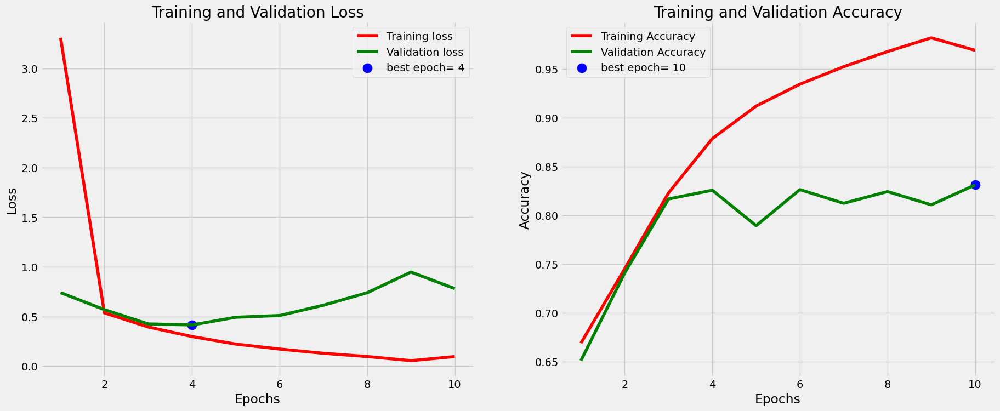


Evaluation Metrics:
157/157 [==============================] - 1s 5ms/step - loss: 0.3166 - accuracy: 0.9188
Test Loss: 0.3166
Test Accuracy: 0.9188

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.85      0.95      0.90      1000
        Colon adenocarcinoma       0.94      0.83      0.88      1000
          Lung Benign Tissue       0.99      1.00      0.99      1000
Lung Squamous Cell Carcinoma       0.93      0.89      0.91      1000
         Lung adenocarcinoma       0.89      0.93      0.91      1000

                    accuracy                           0.92      5000
                   macro avg       0.92      0.92      0.92      5000
                weighted avg       0.92      0.92      0.92      5000


Confusion Matrix:


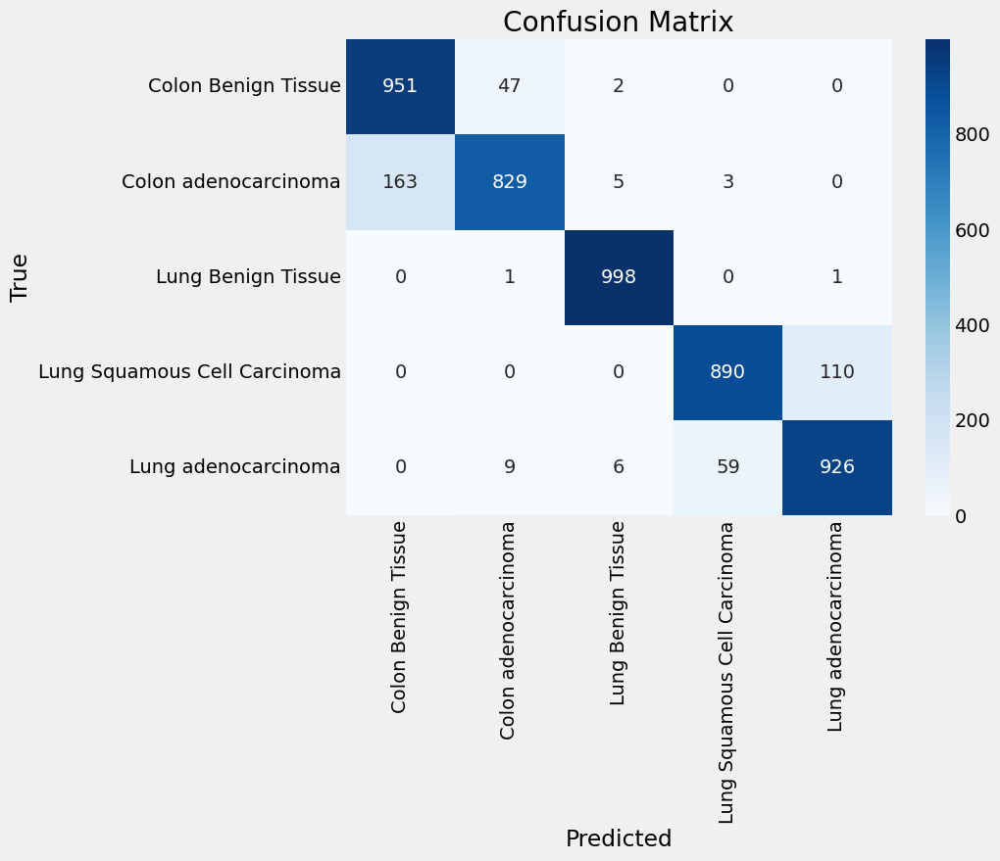

ROC
157/157 [==============================] - 1s 3ms/step


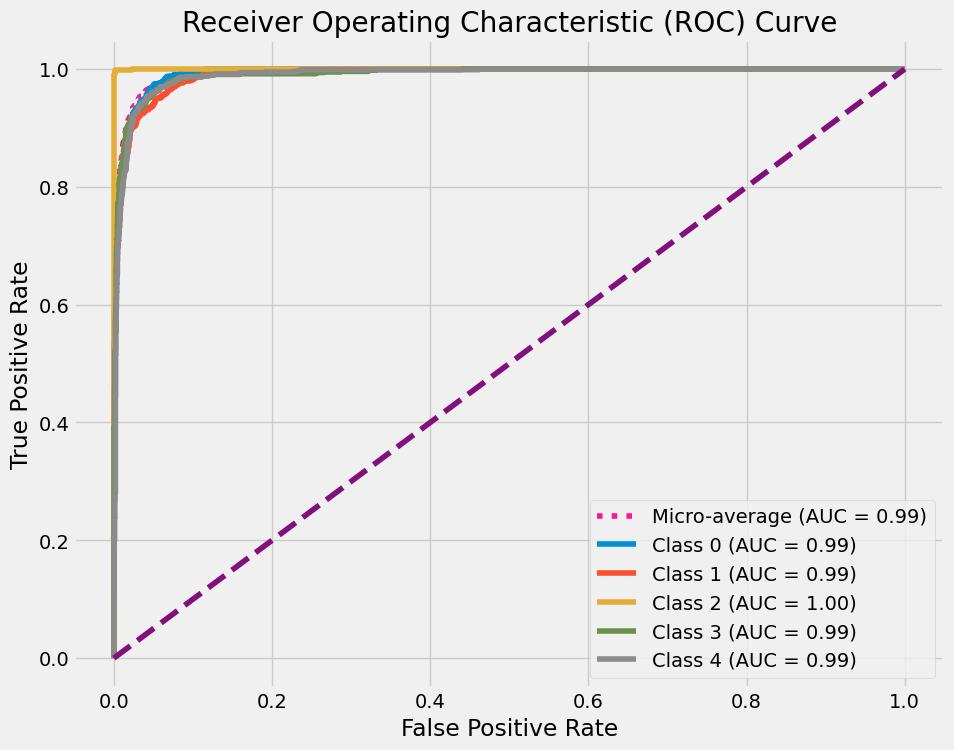

Model Summary:
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_18 (Flatten)        (None, 57600)             0         
                                                                 
 dense_54 (Dense)            (None, 12

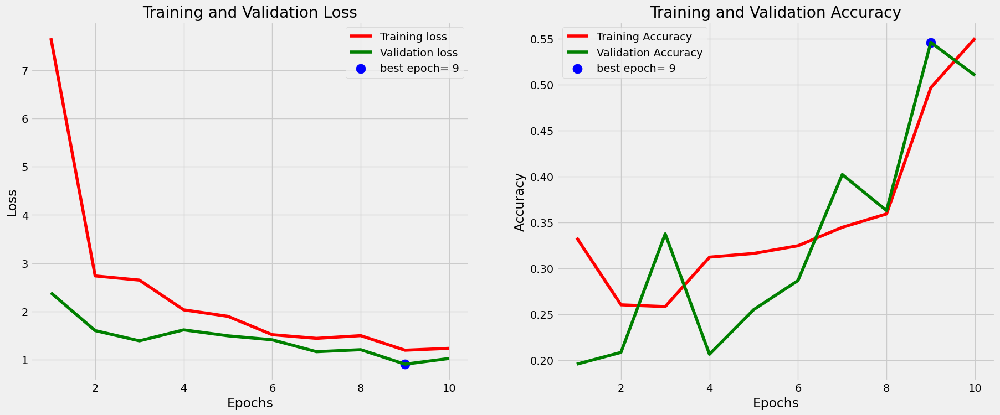


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.3166 - accuracy: 0.9188
Test Loss: 0.3166
Test Accuracy: 0.9188

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.85      0.95      0.90      1000
        Colon adenocarcinoma       0.94      0.83      0.88      1000
          Lung Benign Tissue       0.99      1.00      0.99      1000
Lung Squamous Cell Carcinoma       0.93      0.89      0.91      1000
         Lung adenocarcinoma       0.89      0.93      0.91      1000

                    accuracy                           0.92      5000
                   macro avg       0.92      0.92      0.92      5000
                weighted avg       0.92      0.92      0.92      5000


Confusion Matrix:


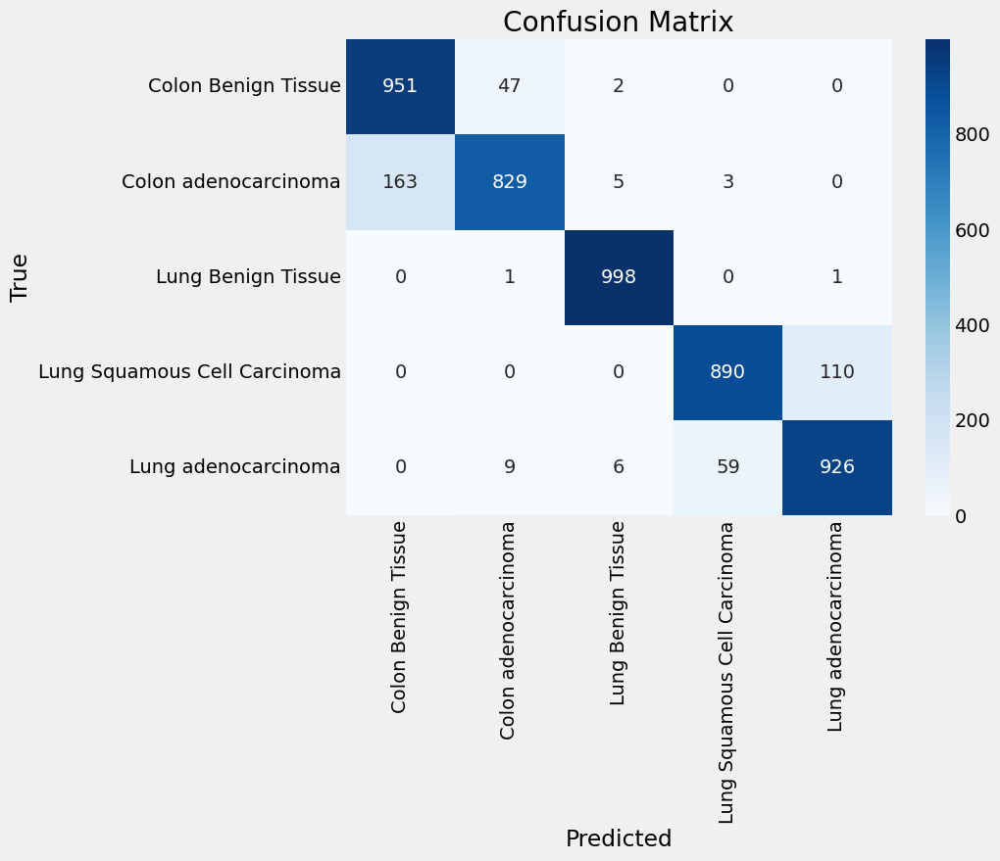

ROC
157/157 [==============================] - 1s 3ms/step


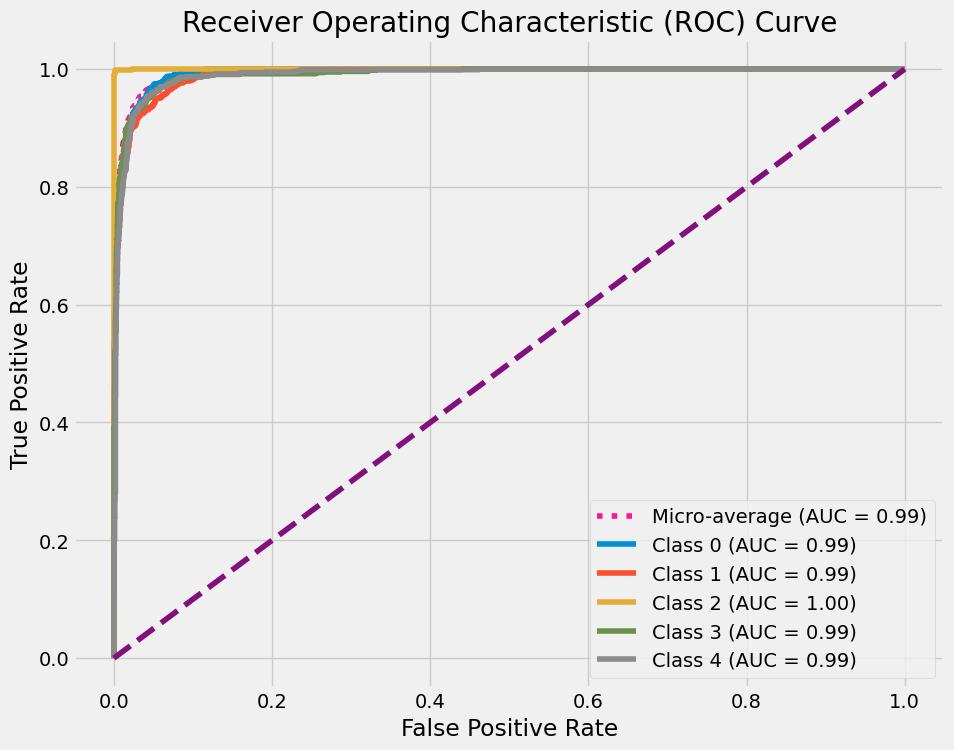

Model Summary:
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_18 (Flatten)        (None, 57600)             0         
                                                                 
 dense_54 (Dense)            (None, 12

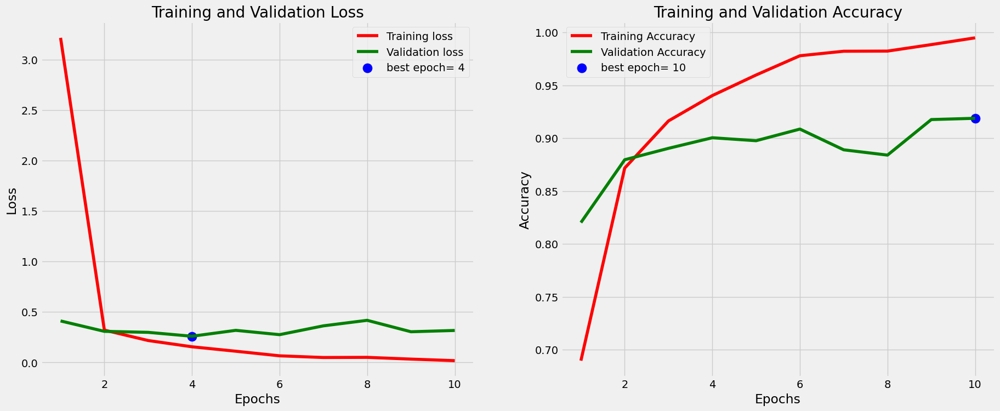


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.3166 - accuracy: 0.9188
Test Loss: 0.3166
Test Accuracy: 0.9188

Classification Report:
157/157 [==============================] - 0s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.85      0.95      0.90      1000
        Colon adenocarcinoma       0.94      0.83      0.88      1000
          Lung Benign Tissue       0.99      1.00      0.99      1000
Lung Squamous Cell Carcinoma       0.93      0.89      0.91      1000
         Lung adenocarcinoma       0.89      0.93      0.91      1000

                    accuracy                           0.92      5000
                   macro avg       0.92      0.92      0.92      5000
                weighted avg       0.92      0.92      0.92      5000


Confusion Matrix:


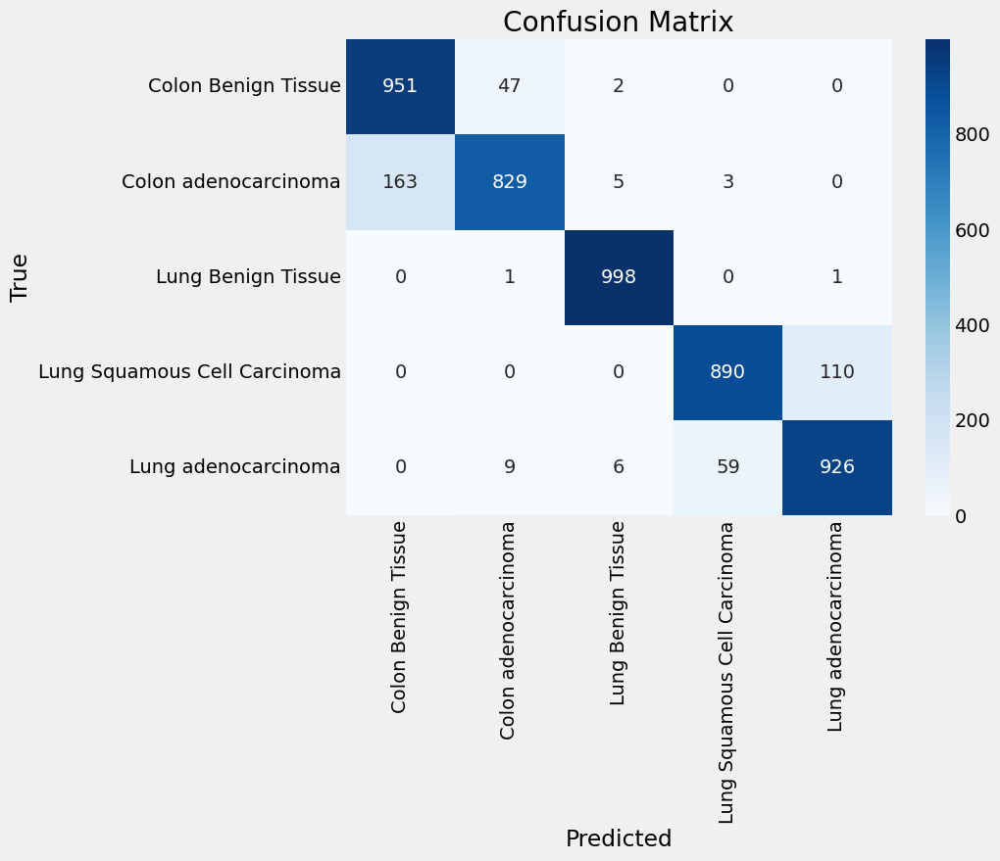

ROC
157/157 [==============================] - 0s 3ms/step


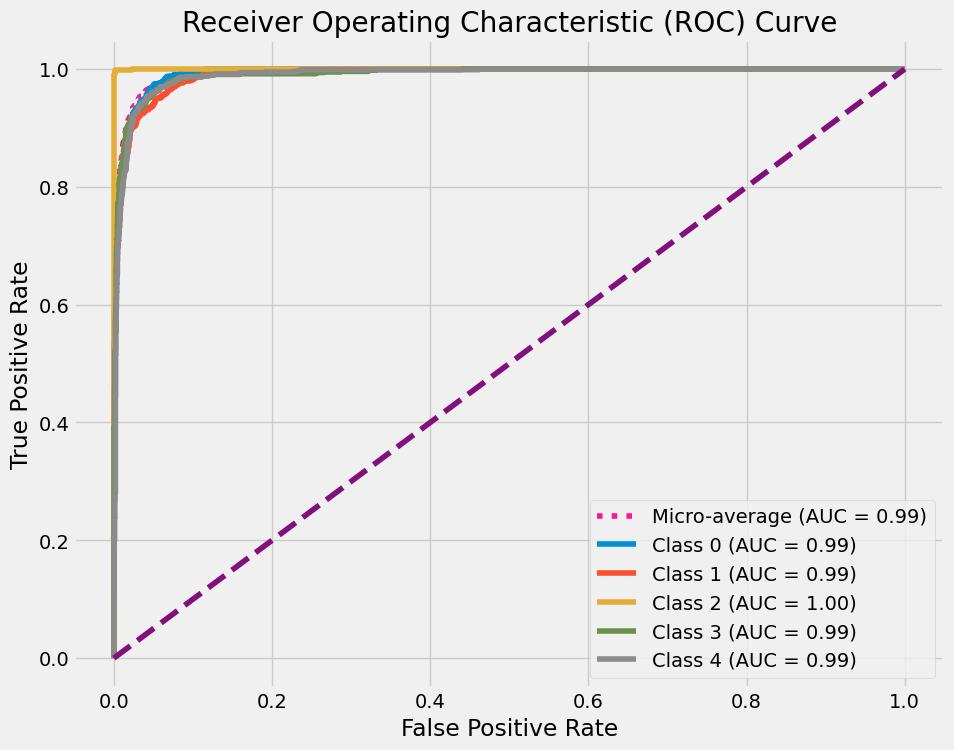

In [209]:
for lr, history in histories_opt2:
    generate_model_report(model_opt2, history, X_val, y_val, target_names=class_names)

# **Regularization**

In [37]:
# Define function to create model with L1 regularization
def create_model_reg(input_shape, num_classes, reg_strength):
    model_reg = models.Sequential()
    model_reg.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_reg.add(layers.MaxPooling2D((2, 2)))
    model_reg.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=regularizers.l1(reg_strength)))
    model_reg.add(layers.MaxPooling2D((2, 2)))
    model_reg.add(layers.Flatten())
    model_reg.add(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l1(reg_strength)))
    model_reg.add(layers.Dense(32, activation='relu', kernel_regularizer=regularizers.l1(reg_strength)))
    model_reg.add(layers.Dense(num_classes, activation='softmax'))
    return model_reg

# We will use the learning rate that we found to be the optima for our case
learning_rate = 0.0006
# Also we will use the Adamax as it was the best performing
optimizer = legacy.Adamax(learning_rate=learning_rate)
# Regularization strengths to try
reg_strengths = [0.001, 0.01, 0.1]


# Create models for each regularization strength and train them
histories_reg = []
for reg_strength in reg_strengths:
    model_reg = create_model_reg(input_shape, num_classes, reg_strength)
    model_reg.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    history_reg = model_reg.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=1)
    histories_reg.append((f'Reg Strength = {reg_strength}', history_reg))


Epoch 1/10
469/469 [==============================] - 8s 13ms/step - loss: 19.7982 - accuracy: 0.7477 - val_loss: 14.1113 - val_accuracy: 0.8394
Epoch 2/10
469/469 [==============================] - 6s 12ms/step - loss: 12.9127 - accuracy: 0.8447 - val_loss: 11.9514 - val_accuracy: 0.7884
Epoch 3/10
469/469 [==============================] - 6s 12ms/step - loss: 10.8908 - accuracy: 0.8647 - val_loss: 9.9290 - val_accuracy: 0.8834
Epoch 4/10
469/469 [==============================] - 6s 12ms/step - loss: 9.0330 - accuracy: 0.8839 - val_loss: 8.1403 - val_accuracy: 0.8660
Epoch 5/10
469/469 [==============================] - 6s 12ms/step - loss: 7.2065 - accuracy: 0.8963 - val_loss: 6.3989 - val_accuracy: 0.8676
Epoch 6/10
469/469 [==============================] - 6s 12ms/step - loss: 5.4213 - accuracy: 0.9070 - val_loss: 4.6126 - val_accuracy: 0.9042
Epoch 7/10
469/469 [==============================] - 6s 12ms/step - loss: 3.8320 - accuracy: 0.9193 - val_loss: 3.2276 - val_accuracy: 0

In [38]:
# Print accuracy for each regularization strength
for reg_strength, history in zip(reg_strengths, histories_reg):
    val_accuracy_reg = history[1].history['val_accuracy'][-1]
    print(f'Reg Strength = {reg_strength} Validation Accuracy: {val_accuracy_reg}')


Reg Strength = 0.001 Validation Accuracy: 0.9074000120162964
Reg Strength = 0.01 Validation Accuracy: 0.86080002784729
Reg Strength = 0.1 Validation Accuracy: 0.6905999779701233


Model Summary:
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 60, 60, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 57600)             0         
                                                                 
 dense_16 (Dense)            (None, 128

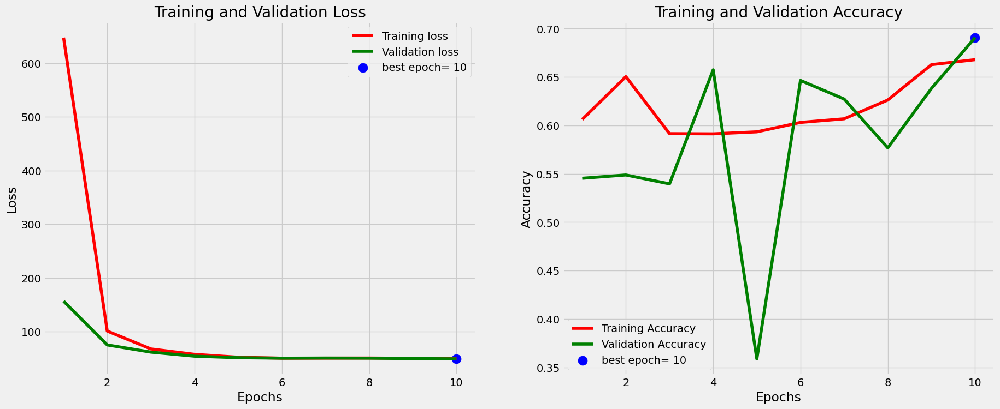


Evaluation Metrics:
157/157 [==============================] - 1s 5ms/step - loss: 49.1803 - accuracy: 0.6906
Test Loss: 49.1803
Test Accuracy: 0.6906

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.65      0.76      0.70      1000
        Colon adenocarcinoma       0.78      0.54      0.64      1000
          Lung Benign Tissue       0.78      0.91      0.84      1000
Lung Squamous Cell Carcinoma       0.65      0.68      0.66      1000
         Lung adenocarcinoma       0.61      0.57      0.59      1000

                    accuracy                           0.69      5000
                   macro avg       0.69      0.69      0.69      5000
                weighted avg       0.69      0.69      0.69      5000


Confusion Matrix:


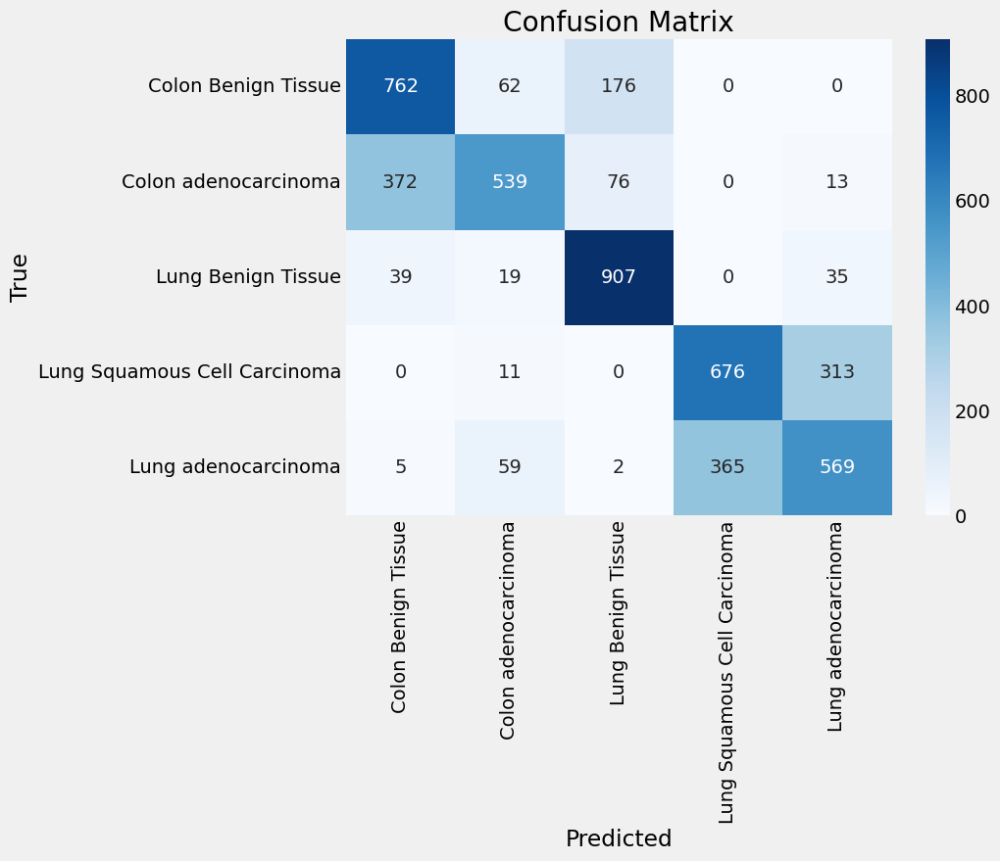

ROC
157/157 [==============================] - 1s 3ms/step


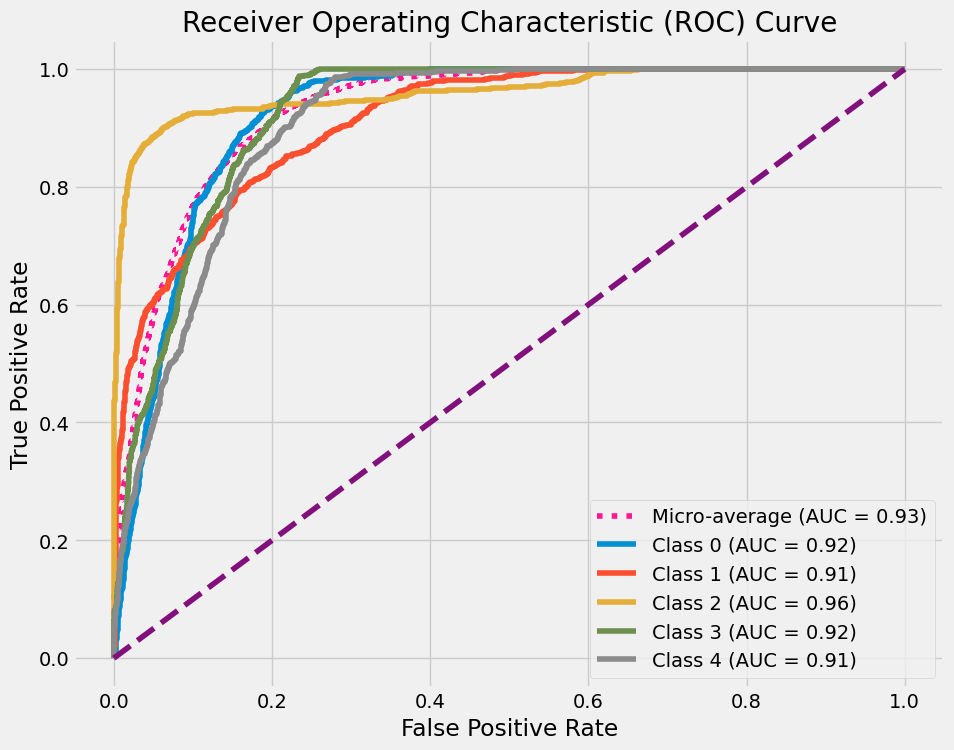

Model Summary:
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 60, 60, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 57600)             0         
                                                                 
 dense_16 (Dense)            (None, 128

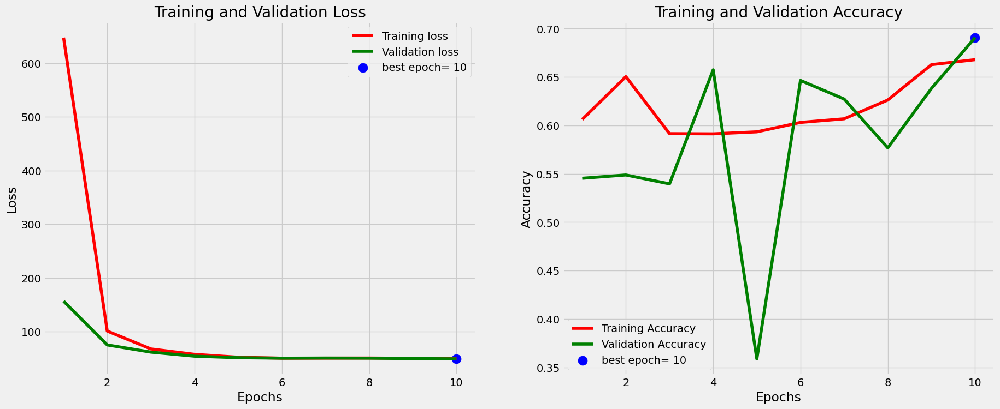


Evaluation Metrics:
157/157 [==============================] - 1s 5ms/step - loss: 49.1803 - accuracy: 0.6906
Test Loss: 49.1803
Test Accuracy: 0.6906

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.65      0.76      0.70      1000
        Colon adenocarcinoma       0.78      0.54      0.64      1000
          Lung Benign Tissue       0.78      0.91      0.84      1000
Lung Squamous Cell Carcinoma       0.65      0.68      0.66      1000
         Lung adenocarcinoma       0.61      0.57      0.59      1000

                    accuracy                           0.69      5000
                   macro avg       0.69      0.69      0.69      5000
                weighted avg       0.69      0.69      0.69      5000


Confusion Matrix:


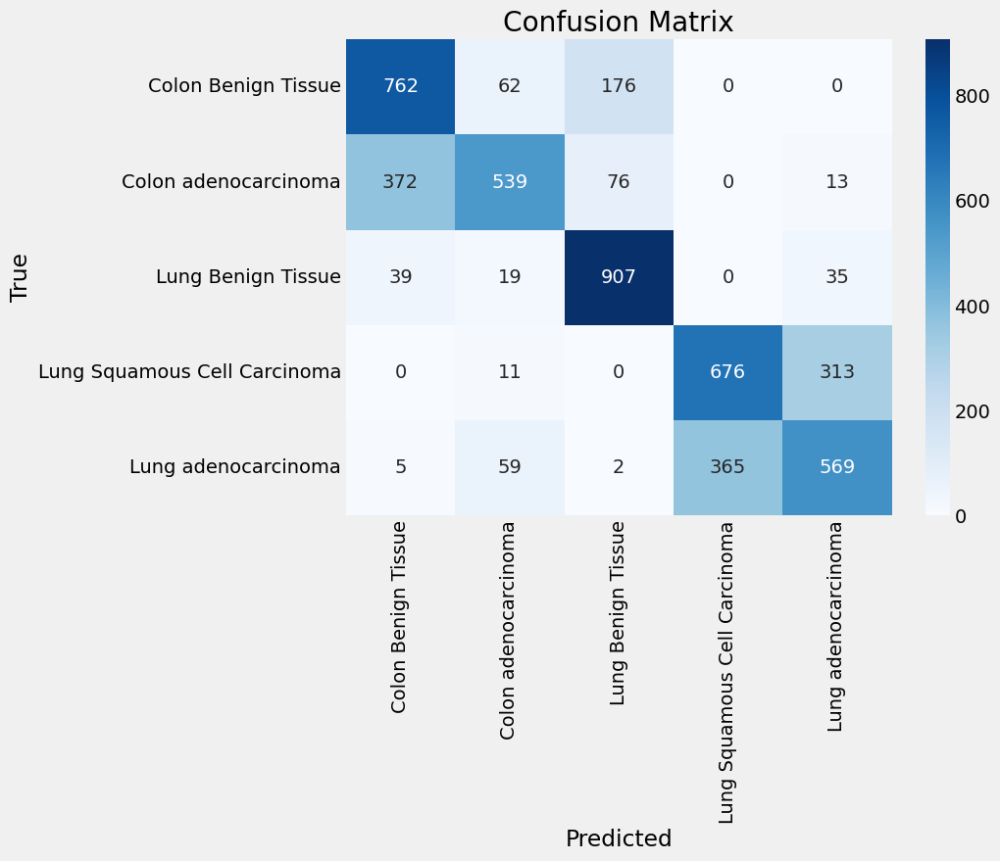

ROC
157/157 [==============================] - 1s 3ms/step


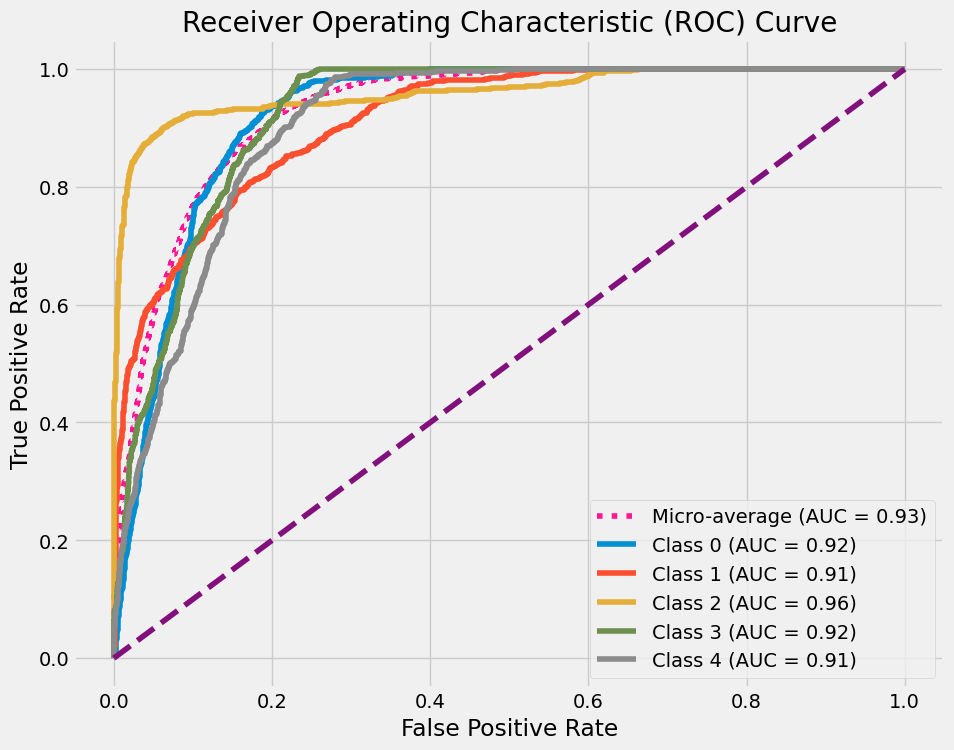

Model Summary:
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 60, 60, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_10 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 57600)             0         
                                                                 
 dense_16 (Dense)            (None, 128

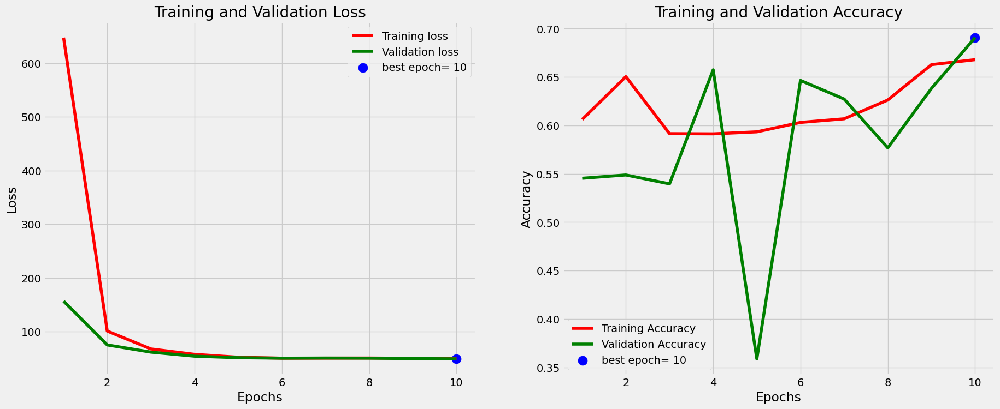


Evaluation Metrics:
157/157 [==============================] - 1s 5ms/step - loss: 49.1803 - accuracy: 0.6906
Test Loss: 49.1803
Test Accuracy: 0.6906

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.65      0.76      0.70      1000
        Colon adenocarcinoma       0.78      0.54      0.64      1000
          Lung Benign Tissue       0.78      0.91      0.84      1000
Lung Squamous Cell Carcinoma       0.65      0.68      0.66      1000
         Lung adenocarcinoma       0.61      0.57      0.59      1000

                    accuracy                           0.69      5000
                   macro avg       0.69      0.69      0.69      5000
                weighted avg       0.69      0.69      0.69      5000


Confusion Matrix:


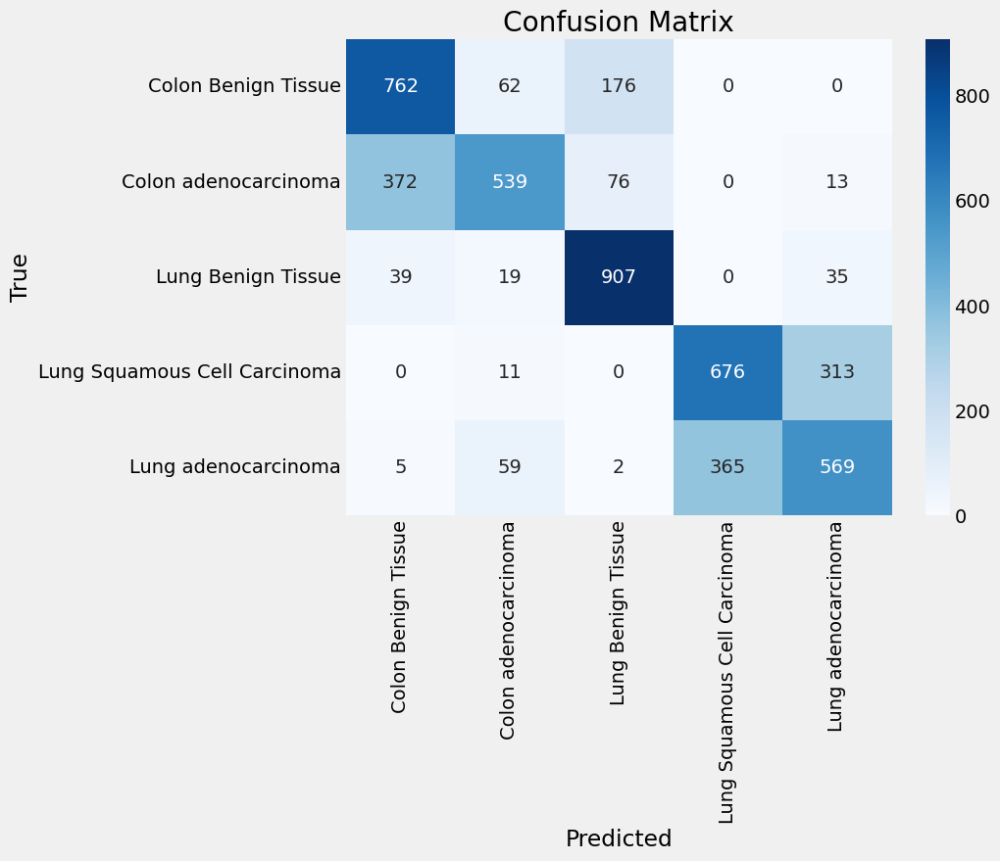

ROC
157/157 [==============================] - 1s 3ms/step


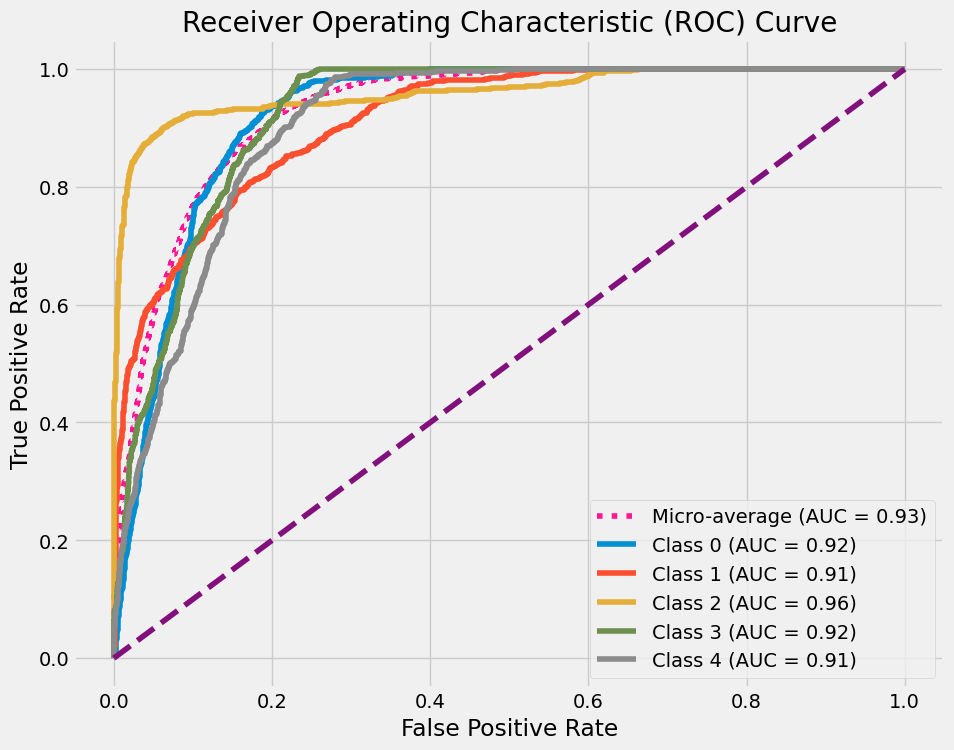

In [40]:
for lr, history in histories_reg:
    generate_model_report(model_reg, history_reg, X_val, y_val, target_names=class_names)

# Testing other learning rates within a loop but proved not optimal, the porpuse was to capture the fully scope of the learning rate in order to avoid local minimum

In [126]:
# import tensorflow as tf
# from tensorflow.keras import models, layers, regularizers

# def create_model_lr1(input_shape, num_classes, learning_rate):
#     model_lr1 = models.Sequential()
#     model_lr1.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
#     model_lr1.add(layers.MaxPooling2D((2, 2)))
#     model_lr1.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
#     model_lr1.add(layers.MaxPooling2D((2, 2)))
#     model_lr1.add(layers.Flatten())
#     model_lr1.add(layers.Dense(128, activation='relu'))
#     model_lr1.add(layers.Dense(32, activation='relu'))
#     model_lr1.add(layers.Dense(num_classes, activation='softmax'))

#     optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
#     model_lr1.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
#     return model_lr1


In [127]:
# import numpy as np
# import tensorflow as tf
# from tensorflow.keras import models, layers, regularizers
# from sklearn.model_selection import ParameterSampler

# # Define the parameter grid for random search
# param_grid = {
#     'learning_rate': [0.0001,  0.0008, 0.0006]
#     # 'batch_size': [32, 64, 128]
# }

# # Perform random search
# param_sampler = ParameterSampler(param_grid, n_iter=5, random_state=42)
# best_accuracy_lr1 = 0
# best_params_lr1 = None

# for params in param_sampler:
#     learning_rate = params['learning_rate']
#     # batch_size = params['batch_size']

#     model_lr11 = create_model_lr1(input_shape, num_classes, learning_rate)
#     history_lr1 = model_lr11.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val), verbose=1)

#     val_accuracy_lr1 = history_lr1.history['val_accuracy'][-1]
#     print(f"Params: {params}, Validation Accuracy: {val_accuracy_lr1}")

#     if val_accuracy_lr1 > best_accuracy_lr1:
#         best_accuracy_lr1 = val_accuracy_lr1
#         best_params_lr1 = params

# print(f"Best parameters: {best_params_lr1}, Best validation accuracy: {best_accuracy_lr1}")


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 3 is smaller than n_iter=5. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Epoch 1/10
469/469 [==============================] - 8s 13ms/step - loss: 1.7516 - accuracy: 0.7450 - val_loss: 0.3801 - val_accuracy: 0.8396
Epoch 2/10
469/469 [==============================] - 6s 12ms/step - loss: 0.3177 - accuracy: 0.8743 - val_loss: 0.3440 - val_accuracy: 0.8684
Epoch 3/10
469/469 [==============================] - 6s 12ms/step - loss: 0.2049 - accuracy: 0.9213 - val_loss: 0.3953 - val_accuracy: 0.8292
Epoch 4/10
469/469 [==============================] - 6s 12ms/step - loss: 0.1368 - accuracy: 0.9493 - val_loss: 0.4191 - val_accuracy: 0.8572
Epoch 5/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0903 - accuracy: 0.9671 - val_loss: 0.2999 - val_accuracy: 0.8904
Epoch 6/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0465 - accuracy: 0.9850 - val_loss: 0.2700 - val_accuracy: 0.9138
Epoch 7/10
469/469 [==============================] - 6s 12ms/step - loss: 0.0508 - accuracy: 0.9825 - val_loss: 0.2952 - val_accuracy: 0.9096

In [210]:
# for lr, history in histories_lr:
#     generate_model_report(model_lr, history, X_val, y_val, target_names=class_names)

NameError: name 'histories_lr' is not defined

# **Epoch Total number tuning and extra layer**

In [172]:
# Expirement with three different  total numbers of epochs and applying an extra layer with 256 filters
# Proved to be the best model on 20 epochs
def create_model_ley( input_shape, num_classes):
    model_ley = models.Sequential()
    model_ley.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_ley.add(layers.MaxPooling2D((2, 2)))
    model_ley.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model_ley.add(layers.MaxPooling2D((2, 2)))
    model_ley.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model_ley.add(layers.MaxPooling2D((2, 2)))
    model_ley.add(layers.Flatten())
    model_ley.add(layers.Dense(128, activation='relu'))
    model_ley.add(layers.Dense(32 , activation='relu'))
    model_ley.add(layers.Dense(num_classes, activation='softmax'))
    return model_ley

In [175]:
# Define epochs to try
epochs_list = [20, 40, 60]
learning_rate = 0.0006

# Create models for each number of epochs and train them
histories_batch = []
# Create models for each number of epochs and train them

for epochs in epochs_list:
    print(f"Training model with {epochs} epochs...")
    model_batch = create_model_ley(input_shape=input_shape, num_classes=num_classes)
    optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)  # Use tf.keras.optimizers.Adamax instead of legacy optimizer
    model_batch.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    history_batch = model_batch.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=1)
    histories_batch.append((f'Epochs = {epochs}', history_batch))



Training model with 20 epochs...
Epoch 1/20
469/469 [==============================] - 11s 20ms/step - loss: 1.4855 - accuracy: 0.6781 - val_loss: 0.4993 - val_accuracy: 0.7768
Epoch 2/20
469/469 [==============================] - 9s 19ms/step - loss: 0.4414 - accuracy: 0.8100 - val_loss: 0.3864 - val_accuracy: 0.8374
Epoch 3/20
469/469 [==============================] - 9s 19ms/step - loss: 0.3589 - accuracy: 0.8508 - val_loss: 0.4177 - val_accuracy: 0.8260
Epoch 4/20
469/469 [==============================] - 9s 19ms/step - loss: 0.2971 - accuracy: 0.8799 - val_loss: 0.2654 - val_accuracy: 0.8936
Epoch 5/20
469/469 [==============================] - 9s 19ms/step - loss: 0.2627 - accuracy: 0.8961 - val_loss: 0.2413 - val_accuracy: 0.9048
Epoch 6/20
469/469 [==============================] - 9s 19ms/step - loss: 0.2145 - accuracy: 0.9157 - val_loss: 0.4190 - val_accuracy: 0.8440
Epoch 7/20
469/469 [==============================] - 9s 19ms/step - loss: 0.1750 - accuracy: 0.9331 - val_l

In [176]:
# Print accuracy for each regularization strength
for epoch, history in zip(epochs_list, histories_batch):
    val_accuracy_epochs = history[1].history['val_accuracy'][-1]  # Get the final validation accuracy
    print(f'epoch  number = {epoch} Validation Accuracy: {val_accuracy_epochs}')


epoch  number = 20 Validation Accuracy: 0.9648000001907349
epoch  number = 40 Validation Accuracy: 0.9638000130653381
epoch  number = 60 Validation Accuracy: 0.9625999927520752


Model Summary:
Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_137 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_137 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_138 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_138 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_139 (Conv2D)         (None, 30, 30, 64)        147520    
                                                                 
 max_pooling2d_139 (MaxPool  (None, 15

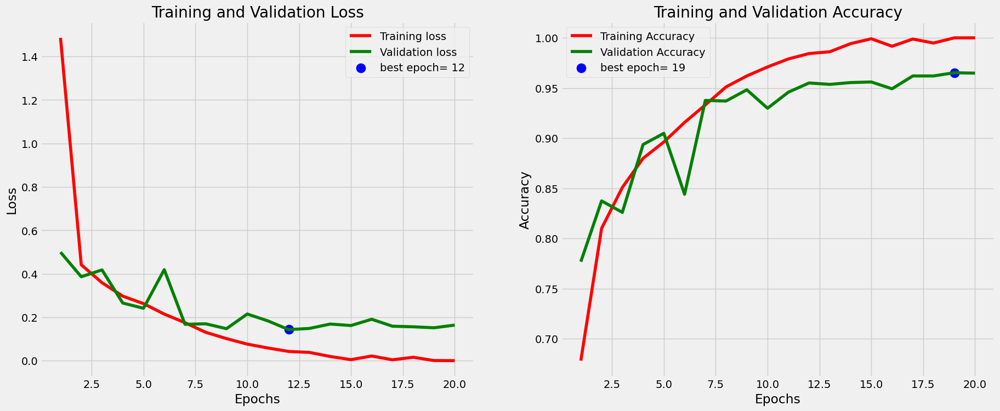


Evaluation Metrics:
157/157 [==============================] - 1s 6ms/step - loss: 0.2589 - accuracy: 0.9626
Test Loss: 0.2589
Test Accuracy: 0.9626

Classification Report:
157/157 [==============================] - 1s 5ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.97      0.98      0.97      1000
        Colon adenocarcinoma       0.97      0.97      0.97      1000
          Lung Benign Tissue       1.00      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.94      0.95      0.94      1000
         Lung adenocarcinoma       0.94      0.93      0.93      1000

                    accuracy                           0.96      5000
                   macro avg       0.96      0.96      0.96      5000
                weighted avg       0.96      0.96      0.96      5000


Confusion Matrix:


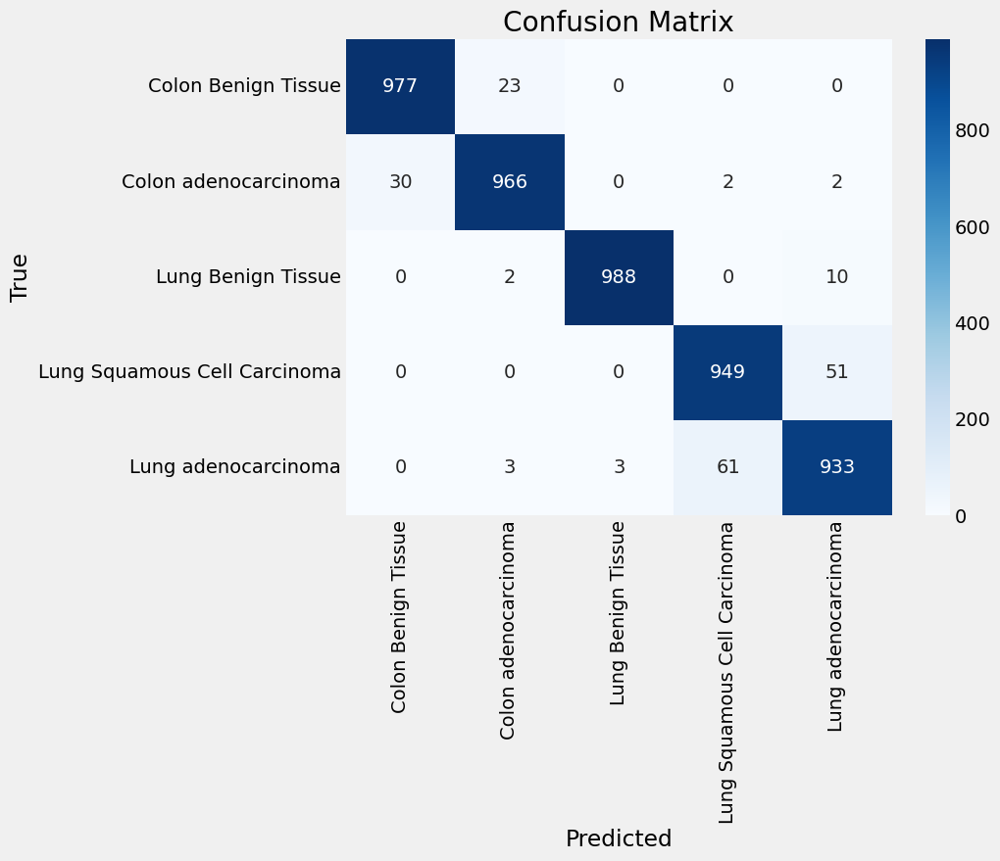

ROC
157/157 [==============================] - 1s 5ms/step


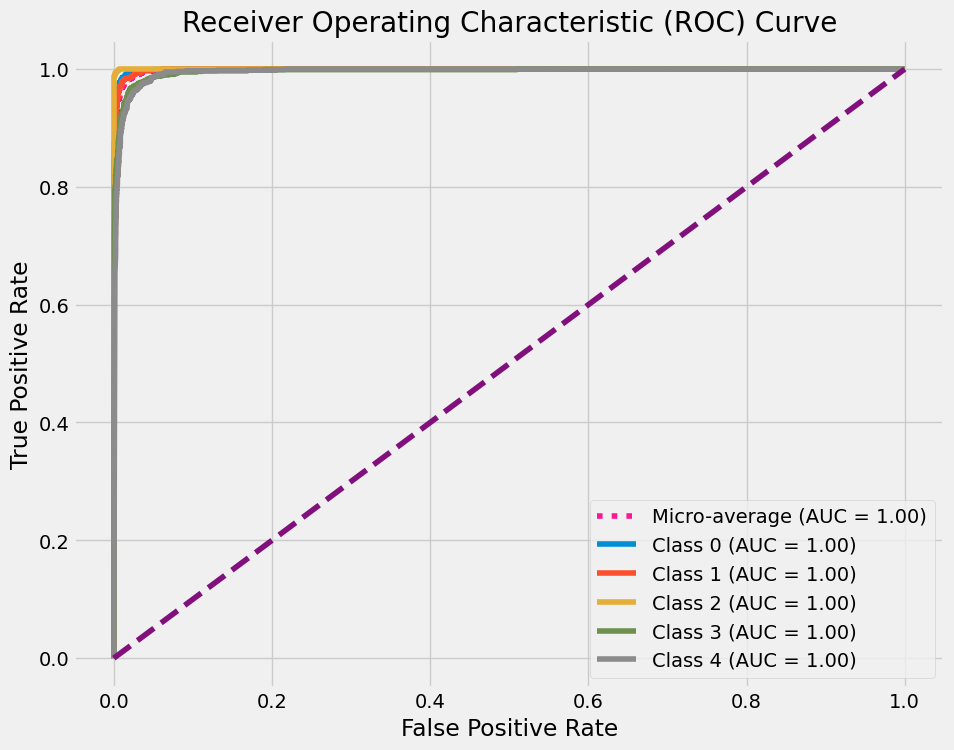

Model Summary:
Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_137 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_137 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_138 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_138 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_139 (Conv2D)         (None, 30, 30, 64)        147520    
                                                                 
 max_pooling2d_139 (MaxPool  (None, 15

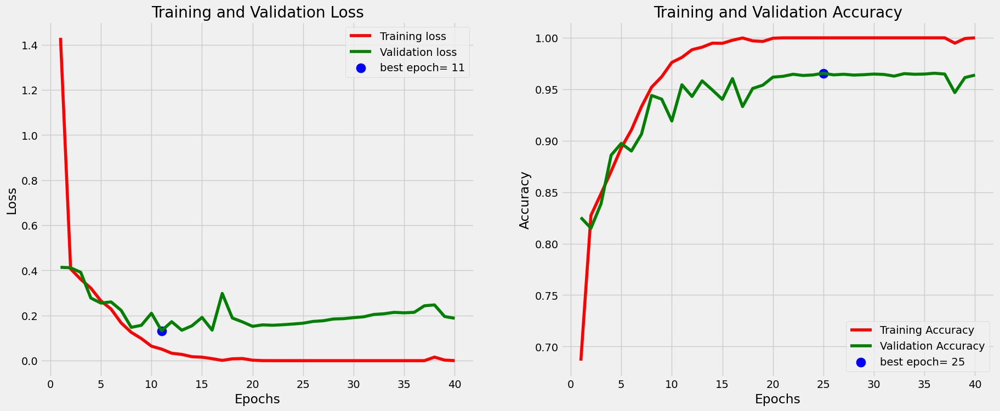


Evaluation Metrics:
157/157 [==============================] - 1s 6ms/step - loss: 0.2589 - accuracy: 0.9626
Test Loss: 0.2589
Test Accuracy: 0.9626

Classification Report:
157/157 [==============================] - 1s 5ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.97      0.98      0.97      1000
        Colon adenocarcinoma       0.97      0.97      0.97      1000
          Lung Benign Tissue       1.00      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.94      0.95      0.94      1000
         Lung adenocarcinoma       0.94      0.93      0.93      1000

                    accuracy                           0.96      5000
                   macro avg       0.96      0.96      0.96      5000
                weighted avg       0.96      0.96      0.96      5000


Confusion Matrix:


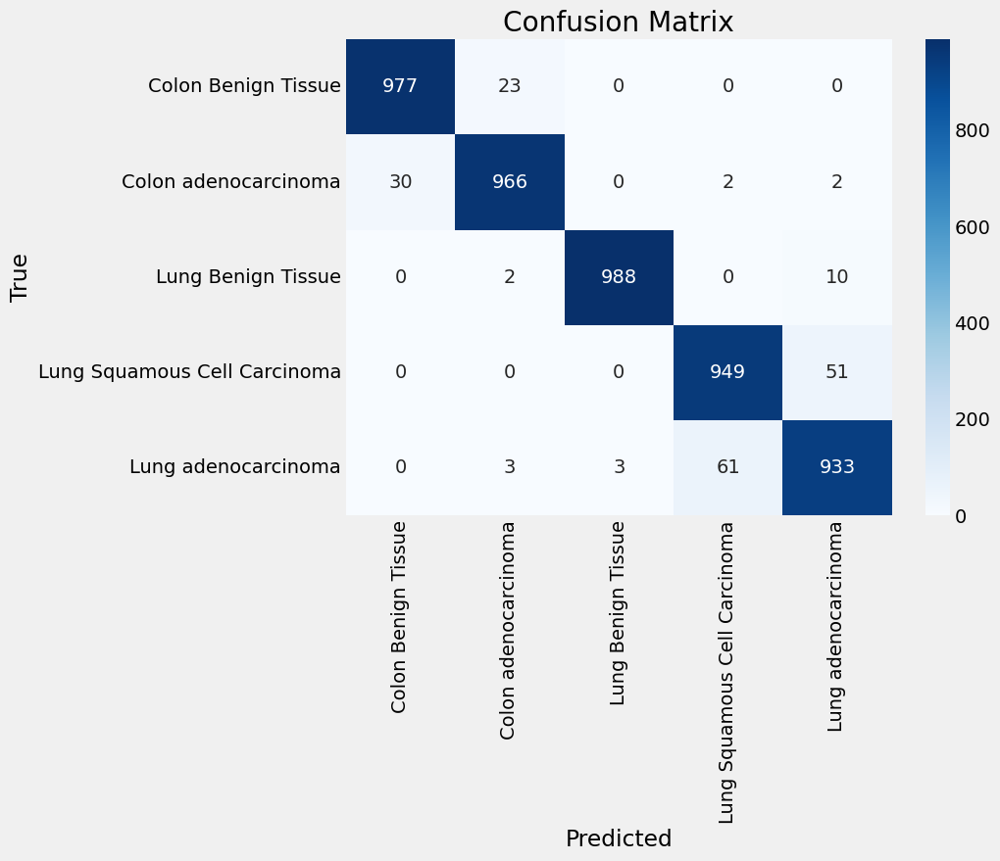

ROC
157/157 [==============================] - 1s 5ms/step


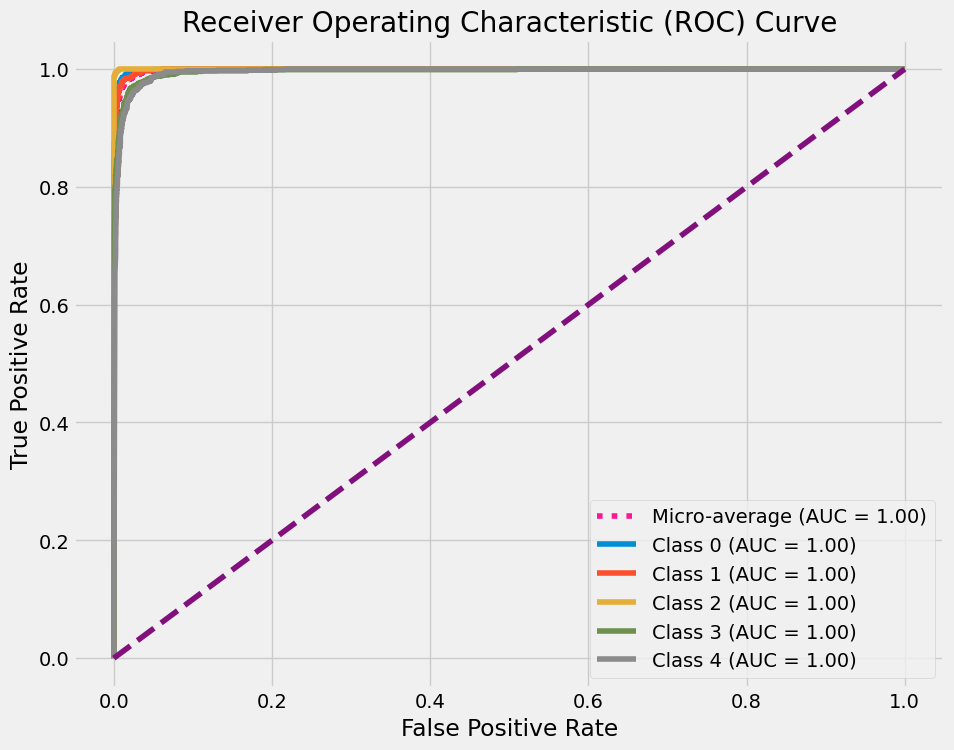

Model Summary:
Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_137 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_137 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_138 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_138 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_139 (Conv2D)         (None, 30, 30, 64)        147520    
                                                                 
 max_pooling2d_139 (MaxPool  (None, 15

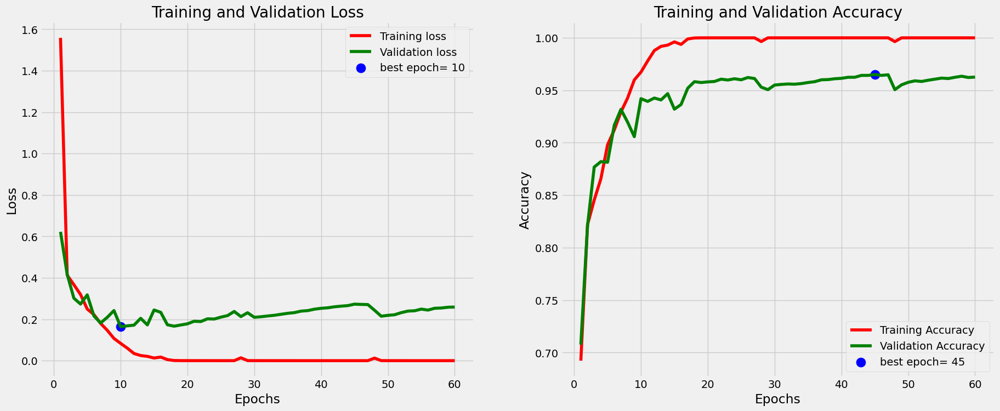


Evaluation Metrics:
157/157 [==============================] - 1s 7ms/step - loss: 0.2589 - accuracy: 0.9626
Test Loss: 0.2589
Test Accuracy: 0.9626

Classification Report:
157/157 [==============================] - 1s 5ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.97      0.98      0.97      1000
        Colon adenocarcinoma       0.97      0.97      0.97      1000
          Lung Benign Tissue       1.00      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.94      0.95      0.94      1000
         Lung adenocarcinoma       0.94      0.93      0.93      1000

                    accuracy                           0.96      5000
                   macro avg       0.96      0.96      0.96      5000
                weighted avg       0.96      0.96      0.96      5000


Confusion Matrix:


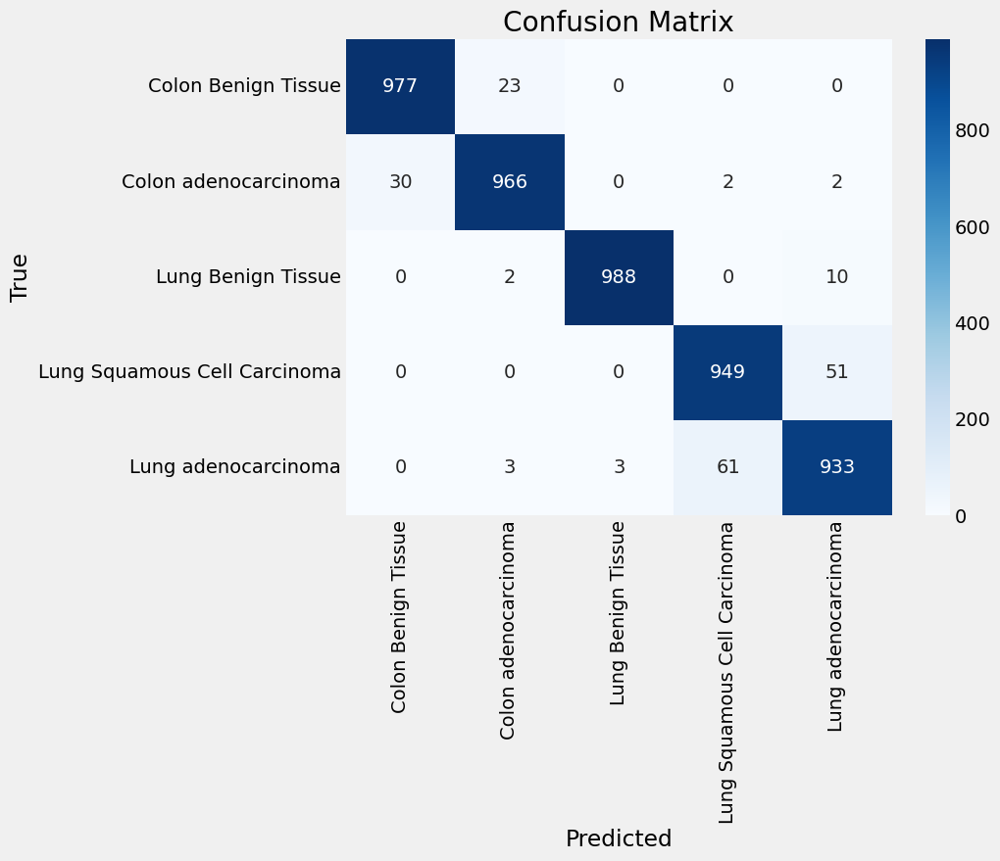

ROC
157/157 [==============================] - 1s 5ms/step


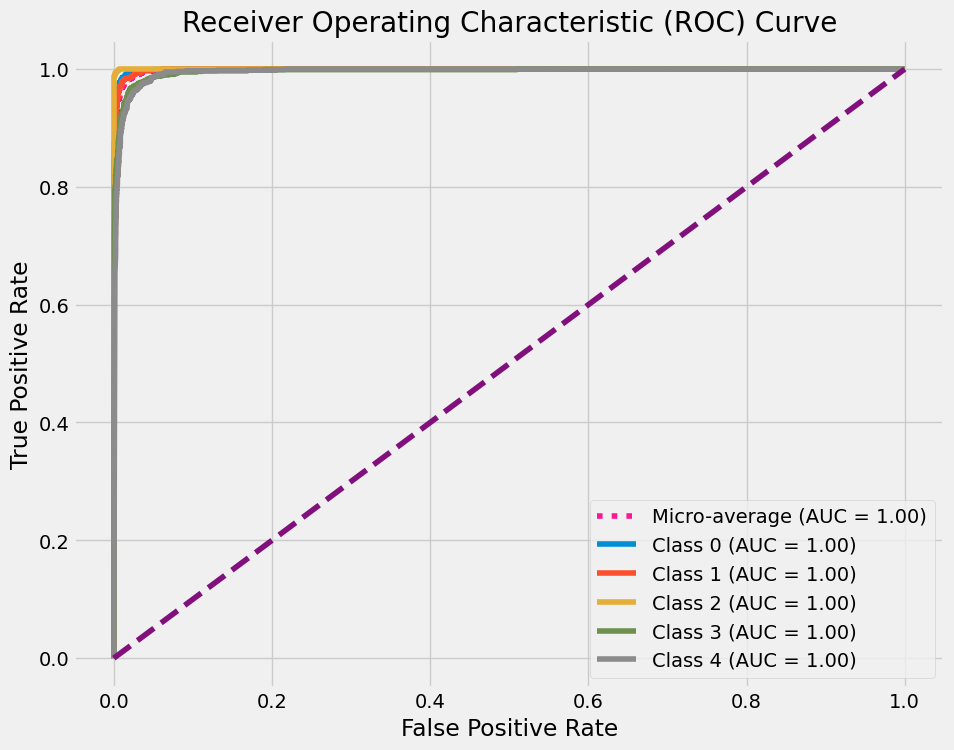

In [211]:
for epoch, history in zip(epochs_list, histories_batch):
    generate_model_report(model_batch, history[1], X_val, y_val, target_names=class_names)

***experimenting with the number of neurons in Dense layers(maybe later).***

In [169]:
def create_model_n(neuron, input_shape, num_classes):
    model_n = models.Sequential()
    model_n.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_n.add(layers.MaxPooling2D((2, 2)))
    model_n.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model_n.add(layers.MaxPooling2D((2, 2)))
    model_n.add(layers.Flatten())
    model_n.add(layers.Dense(128, activation='relu'))
    model_n.add(layers.Dense(32, activation='relu'))
    model_n.add(layers.Dense(num_classes, activation='softmax'))
    return model_n

    # def create_model_ley( input_shape, num_classes):
    # model_ley = models.Sequential()
    # model_ley.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    # model_ley.add(layers.MaxPooling2D((2, 2)))
    # model_ley.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    # model_ley.add(layers.MaxPooling2D((2, 2)))
    # model_ley.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    # model_ley.add(layers.MaxPooling2D((2, 2)))
    # model_ley.add(layers.Flatten())
    # model_ley.add(layers.Dense(128, activation='relu'))
    # model_ley.add(layers.Dense(32 , activation='relu'))
    # model_ley.add(layers.Dense(num_classes, activation='softmax'))
    # return model_ley

In [170]:
# Define the list of neurons to try
neurons_list = [ 256,  512]

# Create models for each number of neurons and train them
histories_neurons = []
optimizer = legacy.Adamax(learning_rate=learning_rate)

for neuron in neurons_list:
    print(neuron)
    model_n = create_model_n(input_shape=input_shape, num_classes=num_classes, neuron=neuron)
    model_n.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    history_neuron = model_n.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), verbose=1)
    histories_neurons.append((f'Neurons = {neuron}', history_neuron))


256
Epoch 1/30
469/469 [==============================] - 7s 13ms/step - loss: 2.4388 - accuracy: 0.7188 - val_loss: 0.3961 - val_accuracy: 0.8270
Epoch 2/30
469/469 [==============================] - 5s 12ms/step - loss: 0.3407 - accuracy: 0.8600 - val_loss: 0.3625 - val_accuracy: 0.8380
Epoch 3/30
469/469 [==============================] - 5s 12ms/step - loss: 0.2641 - accuracy: 0.8931 - val_loss: 0.4161 - val_accuracy: 0.8202
Epoch 4/30
469/469 [==============================] - 6s 12ms/step - loss: 0.2125 - accuracy: 0.9163 - val_loss: 0.3673 - val_accuracy: 0.8580
Epoch 5/30
469/469 [==============================] - 6s 12ms/step - loss: 0.1689 - accuracy: 0.9347 - val_loss: 0.3242 - val_accuracy: 0.8762
Epoch 6/30
469/469 [==============================] - 5s 12ms/step - loss: 0.1310 - accuracy: 0.9534 - val_loss: 0.3530 - val_accuracy: 0.8688
Epoch 7/30
469/469 [==============================] - 6s 12ms/step - loss: 0.0959 - accuracy: 0.9650 - val_loss: 0.4655 - val_accuracy: 0.

In [171]:
# Print accuracy for each regularization strength
for neuron, history in zip(neurons_list, histories_neurons):
    val_accuracy = history[1].history['val_accuracy'][-1]  # Get the final validation accuracy
    print(f'epoch  number = {neuron} Validation Accuracy: {val_accuracy}')

epoch  number = 256 Validation Accuracy: 0.9143999814987183
epoch  number = 512 Validation Accuracy: 0.9192000031471252


In [ ]:
# Best performance so far = 0.925599992275238
# still keep the 128 dense window as we didn't beat the best performance

Model Summary:
Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_117 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_117 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_118 (Conv2D)         (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_118 (MaxPool  (None, 30, 30, 64)        0         
 ing2D)                                                          
                                                                 
 flatten_57 (Flatten)        (None, 57600)             0         
                                                                 
 dense_171 (Dense)           (None, 12

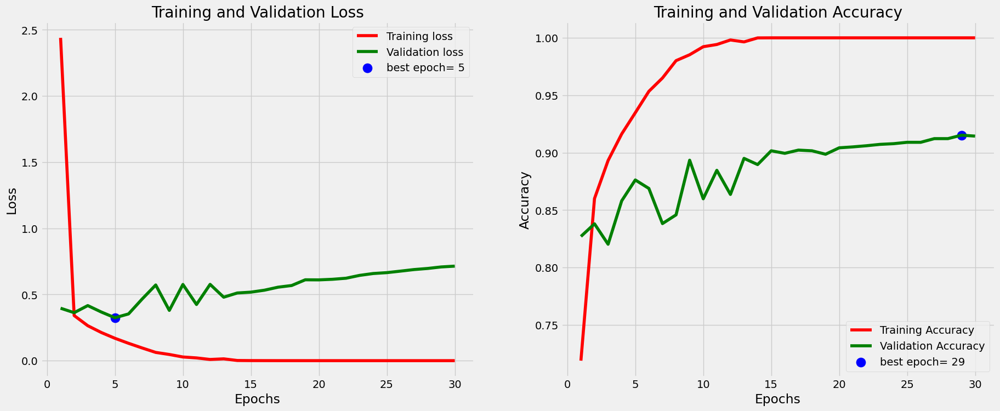


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.6490 - accuracy: 0.9192
Test Loss: 0.6490
Test Accuracy: 0.9192

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.89      0.90      0.90      1000
        Colon adenocarcinoma       0.89      0.88      0.89      1000
          Lung Benign Tissue       0.99      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.91      0.93      0.92      1000
         Lung adenocarcinoma       0.91      0.90      0.91      1000

                    accuracy                           0.92      5000
                   macro avg       0.92      0.92      0.92      5000
                weighted avg       0.92      0.92      0.92      5000


Confusion Matrix:


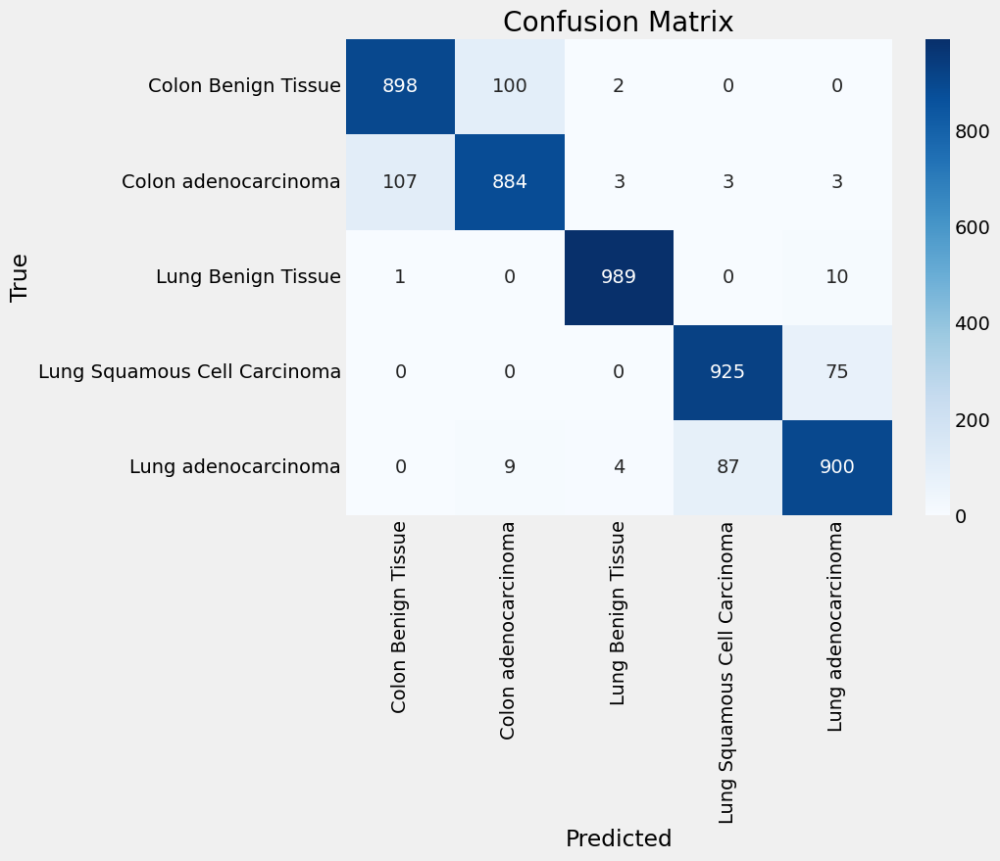

ROC
157/157 [==============================] - 0s 3ms/step


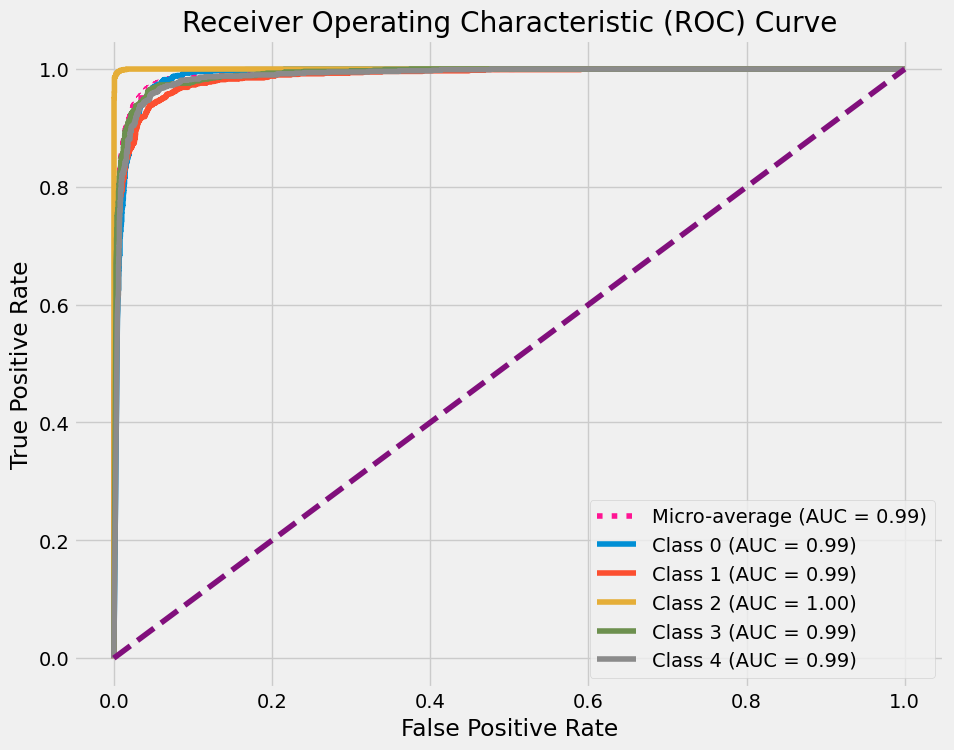

Model Summary:
Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_117 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_117 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_118 (Conv2D)         (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_118 (MaxPool  (None, 30, 30, 64)        0         
 ing2D)                                                          
                                                                 
 flatten_57 (Flatten)        (None, 57600)             0         
                                                                 
 dense_171 (Dense)           (None, 12

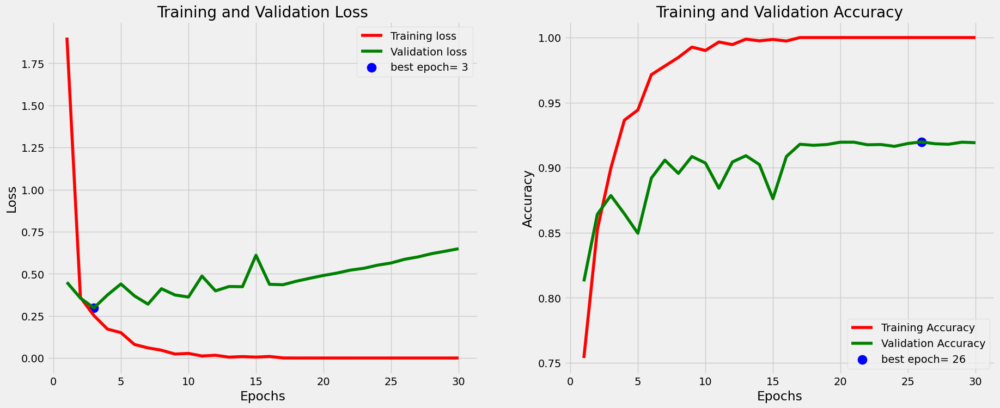


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.6490 - accuracy: 0.9192
Test Loss: 0.6490
Test Accuracy: 0.9192

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.89      0.90      0.90      1000
        Colon adenocarcinoma       0.89      0.88      0.89      1000
          Lung Benign Tissue       0.99      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.91      0.93      0.92      1000
         Lung adenocarcinoma       0.91      0.90      0.91      1000

                    accuracy                           0.92      5000
                   macro avg       0.92      0.92      0.92      5000
                weighted avg       0.92      0.92      0.92      5000


Confusion Matrix:


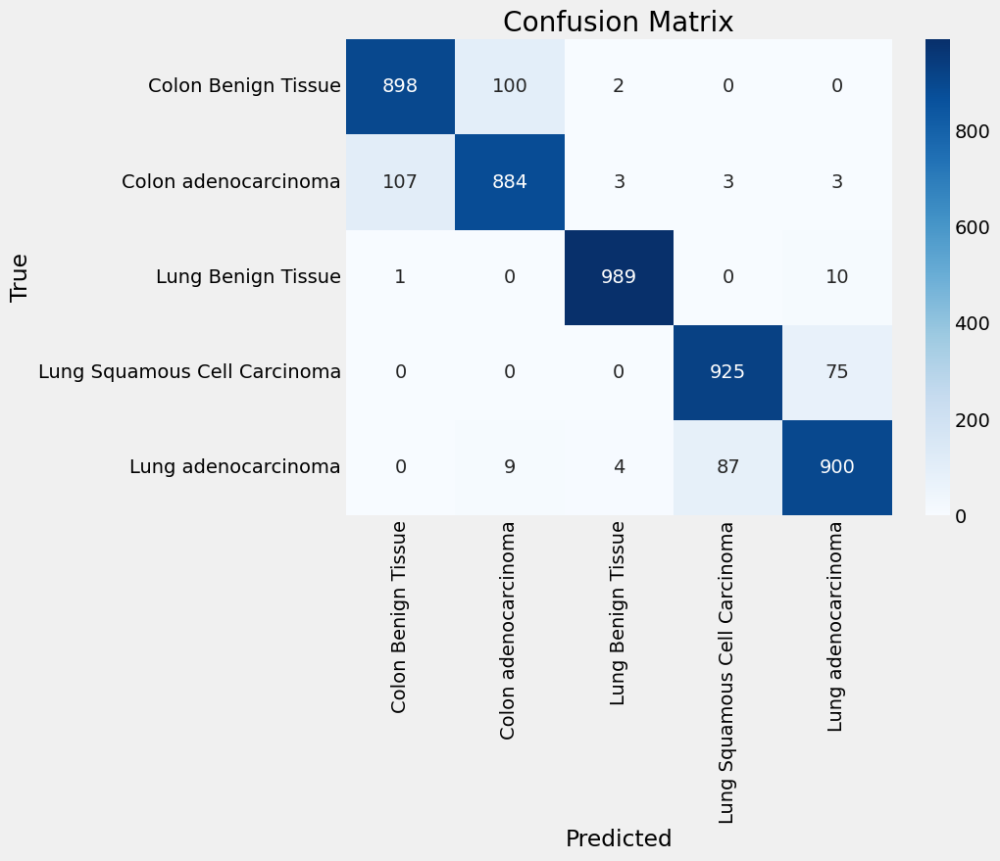

ROC
157/157 [==============================] - 0s 3ms/step


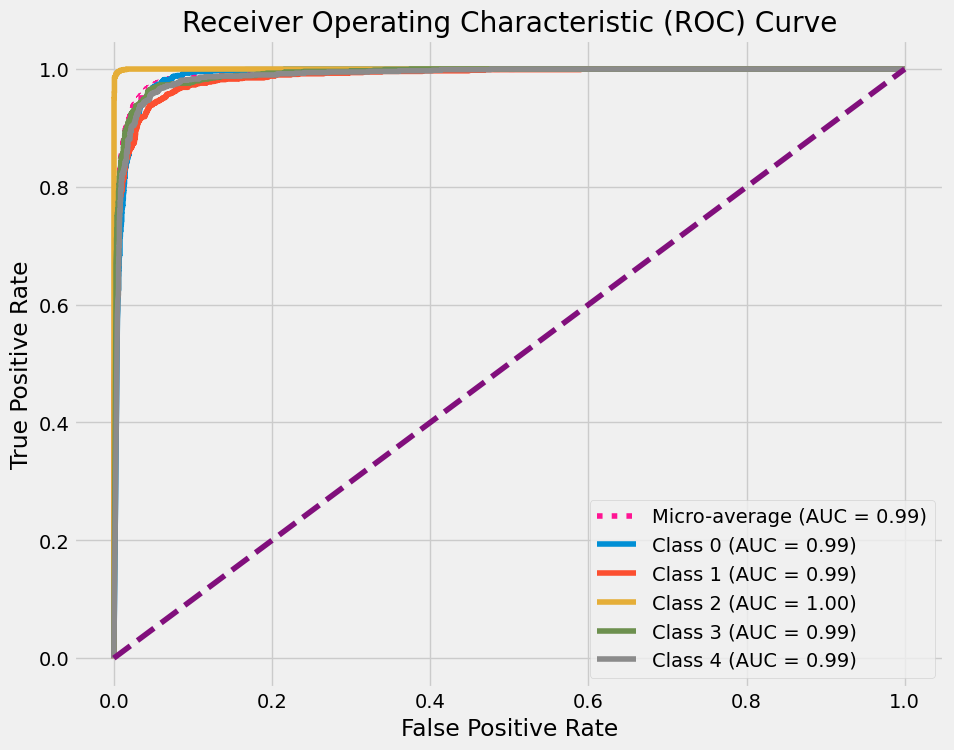

In [212]:
for neuron, history in zip(neurons_list, histories_neurons):
    generate_model_report(model_n, history[1], X_val, y_val, target_names=class_names)

# Early stopping implementation to avoid overfitting


In [141]:
# if for 5 epochs the performance remains the same we stop and proceed
early_stopping = EarlyStopping(monitor='val_loss', patience=5, mode='min', min_delta=0.001)


In [142]:
num_classes = 5
input_shape = (120, 120, 3)
# we apply all the parameters that imporved our model
def create_model_ley( input_shape, num_classes):
    model_ley = models.Sequential()
    model_ley.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_ley.add(layers.MaxPooling2D((2, 2)))
    model_ley.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model_ley.add(layers.MaxPooling2D((2, 2)))
    model_ley.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model_ley.add(layers.MaxPooling2D((2, 2)))
    model_ley.add(layers.Flatten())
    model_ley.add(layers.Dense(128, activation='relu'))
    model_ley.add(layers.Dense(32 , activation='relu'))
    model_ley.add(layers.Dense(num_classes, activation='softmax'))
    return model_ley
epochs = 30
batch_size = 32

learning_rate = 0.0006

model_ley = create_model_ley(input_shape, num_classes)
optimizer = legacy.Adamax(learning_rate=learning_rate)
model_ley.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
model_ley.summary()

history_ley = model_ley.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[early_stopping])
# Get the final accuracy
final_accuracy_ley = history_ley[1].history_ley['val_accuracy'][-1]

# Print the final accuracy
print(f'Final Validation Accuracy: {final_accuracy_ley}')
test_loss_ley, test_accuracy_ley = model_ley.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss_ley}')
print(f'Test Accuracy: {test_accuracy_ley}')
generate_model_report(model= model_ley, history= history_ley, X_test= X_test, y_test= y_test, target_names= class_names)

Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_109 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_109 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_110 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_110 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_111 (Conv2D)         (None, 30, 30, 64)        147520    
                                                                 
 max_pooling2d_111 (MaxPool  (None, 15, 15, 64)      

AttributeError: 'tuple' object has no attribute 'history_ley'

Model Summary:
Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_109 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_109 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_110 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_110 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_111 (Conv2D)         (None, 30, 30, 64)        147520    
                                                                 
 max_pooling2d_111 (MaxPool  (None, 15

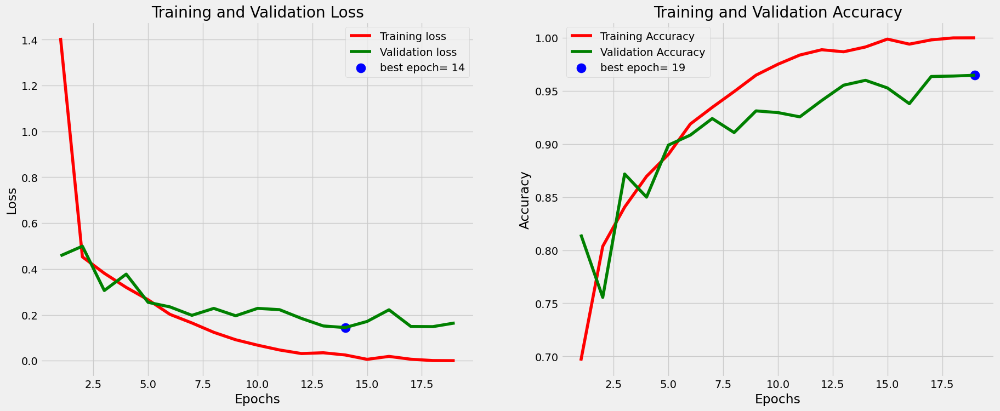


Evaluation Metrics:
157/157 [==============================] - 1s 6ms/step - loss: 0.1646 - accuracy: 0.9648
Test Loss: 0.1646
Test Accuracy: 0.9648

Classification Report:
157/157 [==============================] - 1s 5ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.96      0.98      0.97      1000
        Colon adenocarcinoma       0.97      0.96      0.97      1000
          Lung Benign Tissue       1.00      0.99      1.00      1000
Lung Squamous Cell Carcinoma       0.94      0.95      0.95      1000
         Lung adenocarcinoma       0.95      0.93      0.94      1000

                    accuracy                           0.96      5000
                   macro avg       0.96      0.96      0.96      5000
                weighted avg       0.96      0.96      0.96      5000


Confusion Matrix:


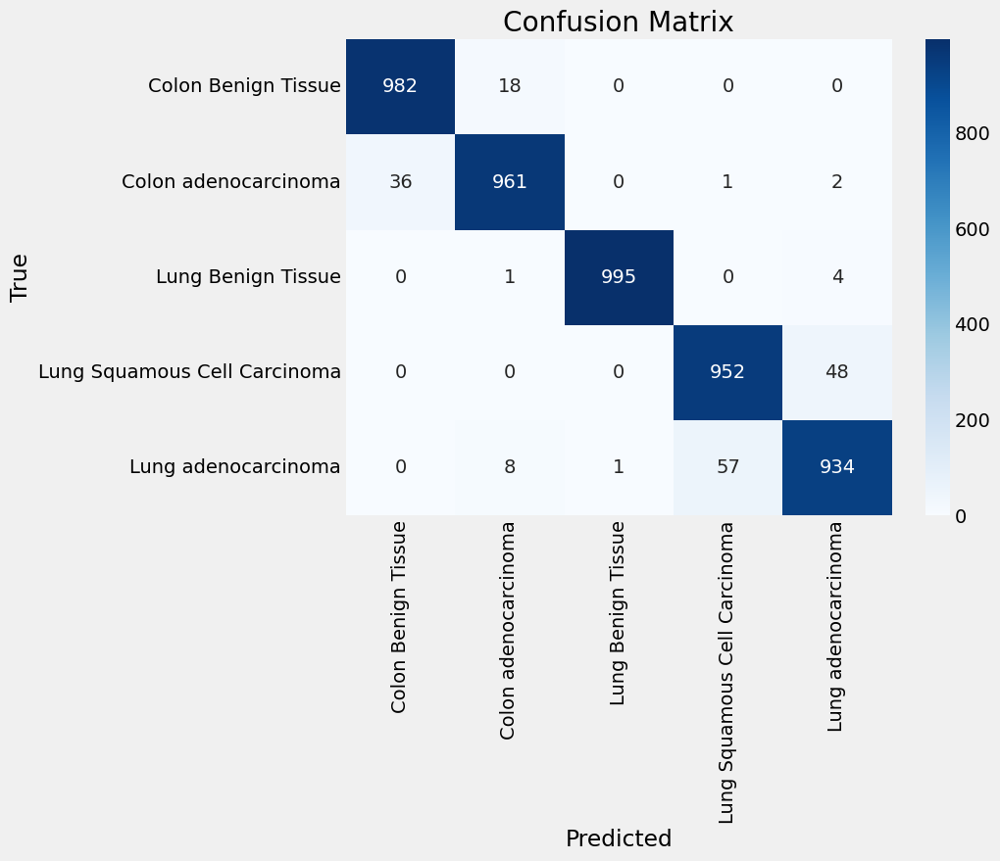

ROC
157/157 [==============================] - 1s 5ms/step


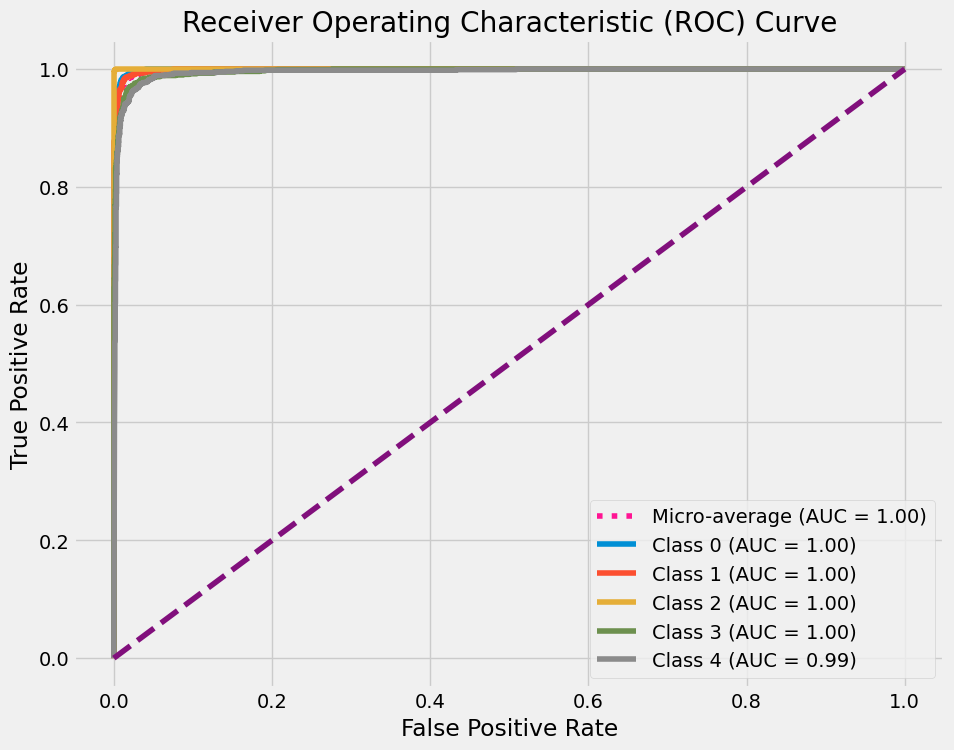

In [150]:
generate_model_report(model=model_ley, history=history_ley, X_test=X_val, y_test=y_val, target_names=class_names)


Final Validation Accuracy: 0.9648000001907349
157/157 [==============================] - 1s 6ms/step - loss: 0.1863 - accuracy: 0.9610
Test Loss: 0.18629062175750732
Test Accuracy: 0.9610000252723694
Model Summary:
Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_109 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_109 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_110 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_110 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                    

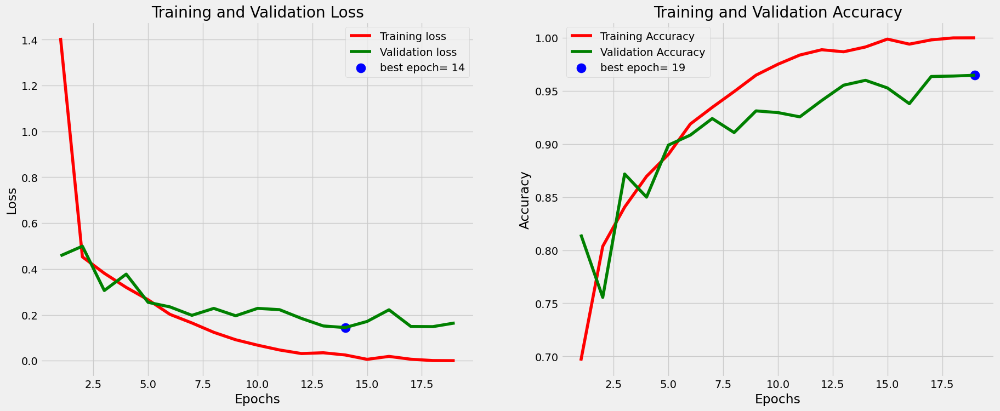


Evaluation Metrics:
157/157 [==============================] - 1s 6ms/step - loss: 0.1646 - accuracy: 0.9648
Test Loss: 0.1646
Test Accuracy: 0.9648

Classification Report:
157/157 [==============================] - 1s 5ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.96      0.98      0.97      1000
        Colon adenocarcinoma       0.97      0.96      0.97      1000
          Lung Benign Tissue       1.00      0.99      1.00      1000
Lung Squamous Cell Carcinoma       0.94      0.95      0.95      1000
         Lung adenocarcinoma       0.95      0.93      0.94      1000

                    accuracy                           0.96      5000
                   macro avg       0.96      0.96      0.96      5000
                weighted avg       0.96      0.96      0.96      5000


Confusion Matrix:


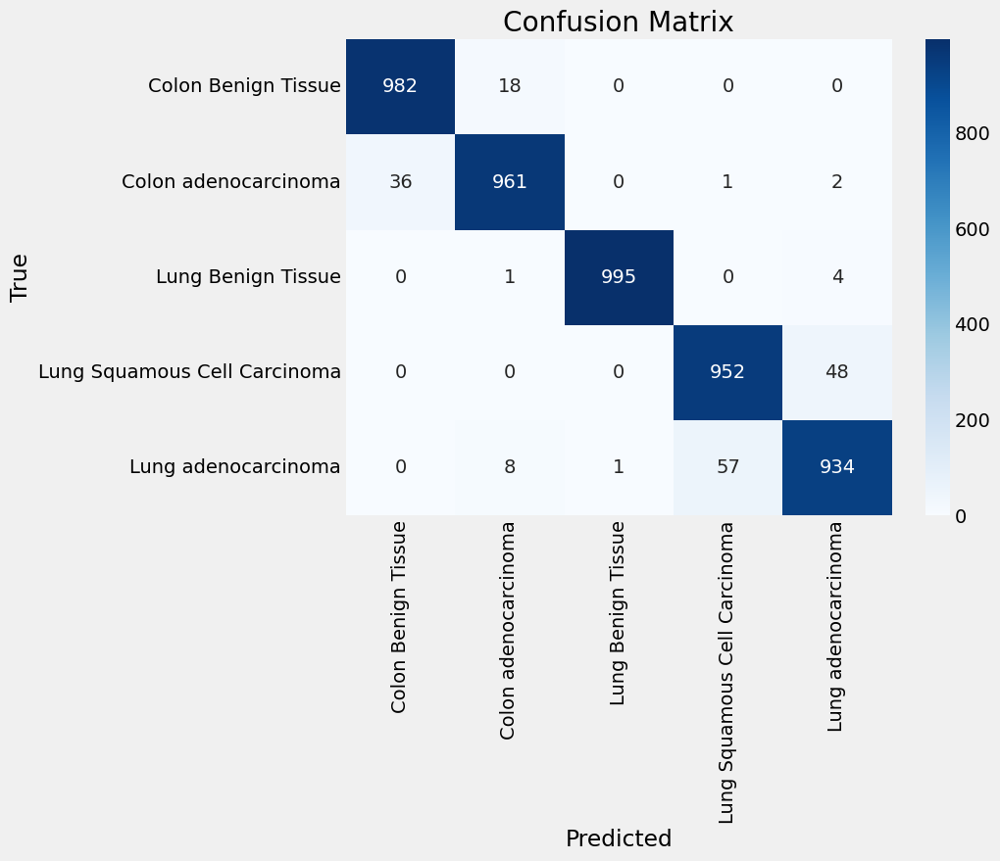

ROC
157/157 [==============================] - 1s 5ms/step


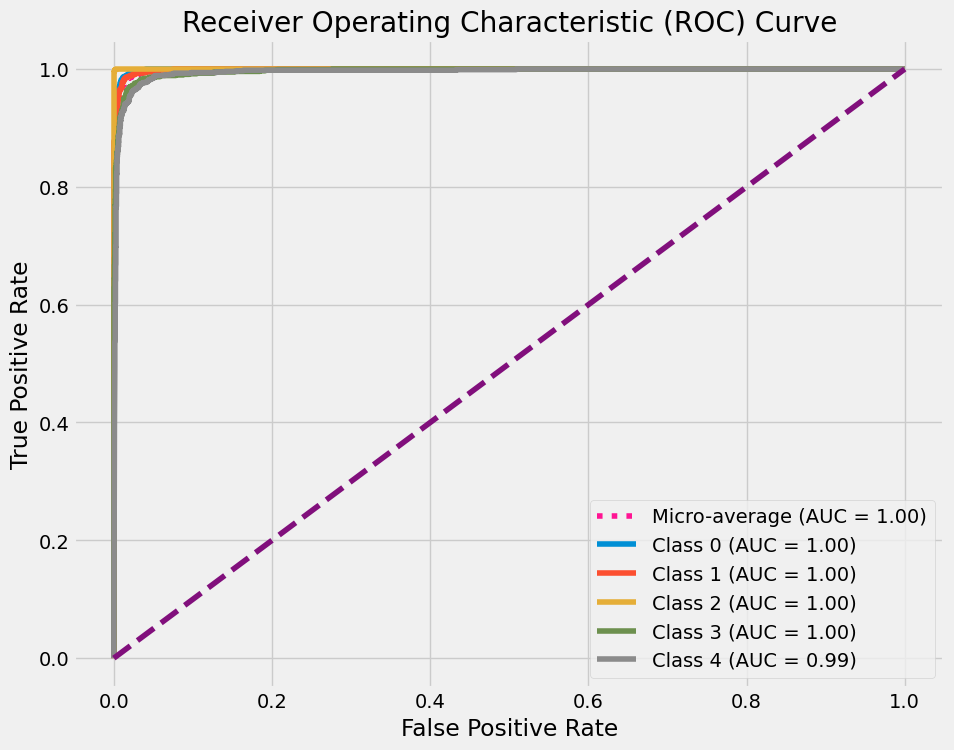

In [213]:
# Get the final accuracy
final_accuracy_ley = history_ley.history['val_accuracy'][-1]

# Print the final accuracy
print(f'Final Validation Accuracy: {final_accuracy_ley}')
test_loss_ley, test_accuracy_ley = model_ley.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss_ley}')
print(f'Test Accuracy: {test_accuracy_ley}')
generate_model_report(model=model_ley, history=history_ley, X_test=X_val, y_test=y_val, target_names=class_names)


# **Filtering Tunning**

Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_146 (Conv2D)         (None, 120, 120, 128)     13952     
                                                                 
 max_pooling2d_146 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_147 (Conv2D)         (None, 60, 60, 256)       1179904   
                                                                 
 max_pooling2d_147 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_148 (Conv2D)         (None, 30, 30, 64)        589888    
                                                                 
 max_pooling2d_148 (MaxPool  (None, 15, 15, 64)      

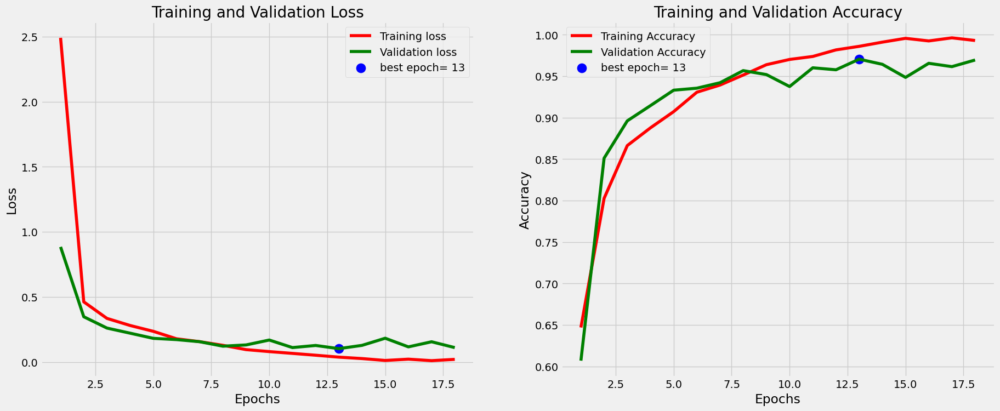


Evaluation Metrics:
157/157 [==============================] - 2s 10ms/step - loss: 0.1108 - accuracy: 0.9696
Test Loss: 0.1108
Test Accuracy: 0.9696

Classification Report:
157/157 [==============================] - 1s 9ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.99      0.99      0.99      1000
        Colon adenocarcinoma       0.98      0.98      0.98      1000
          Lung Benign Tissue       0.99      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.94      0.96      0.95      1000
         Lung adenocarcinoma       0.96      0.92      0.94      1000

                    accuracy                           0.97      5000
                   macro avg       0.97      0.97      0.97      5000
                weighted avg       0.97      0.97      0.97      5000


Confusion Matrix:


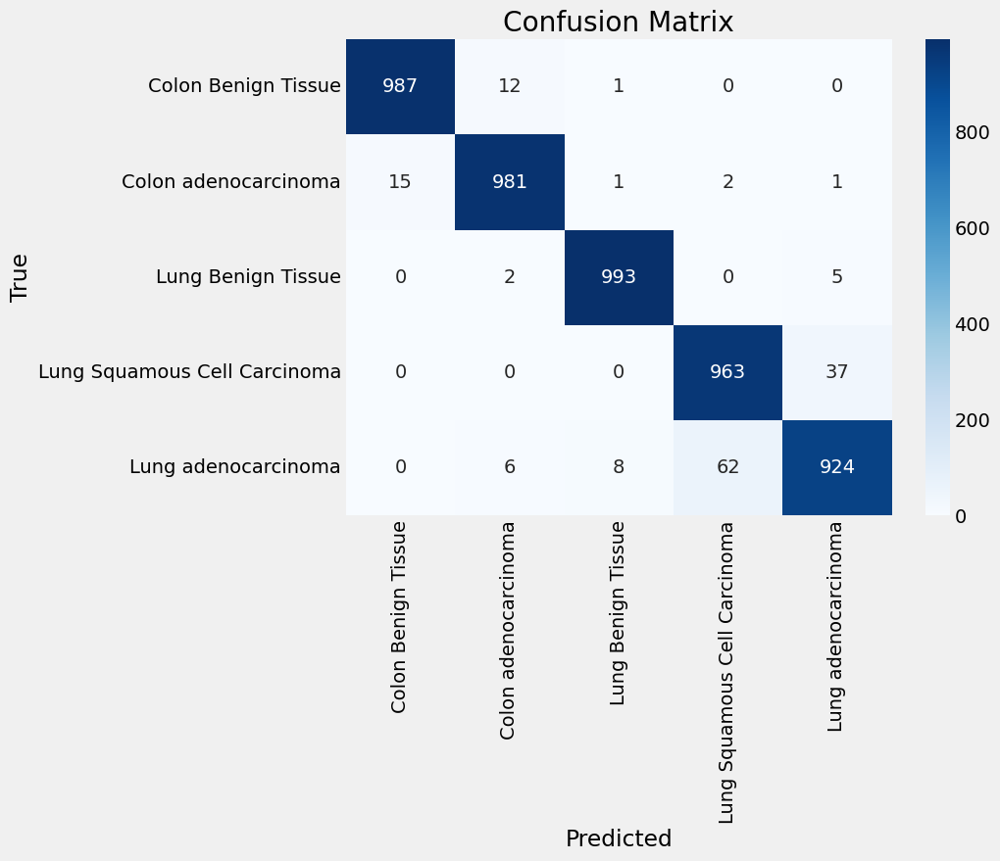

ROC
157/157 [==============================] - 1s 9ms/step


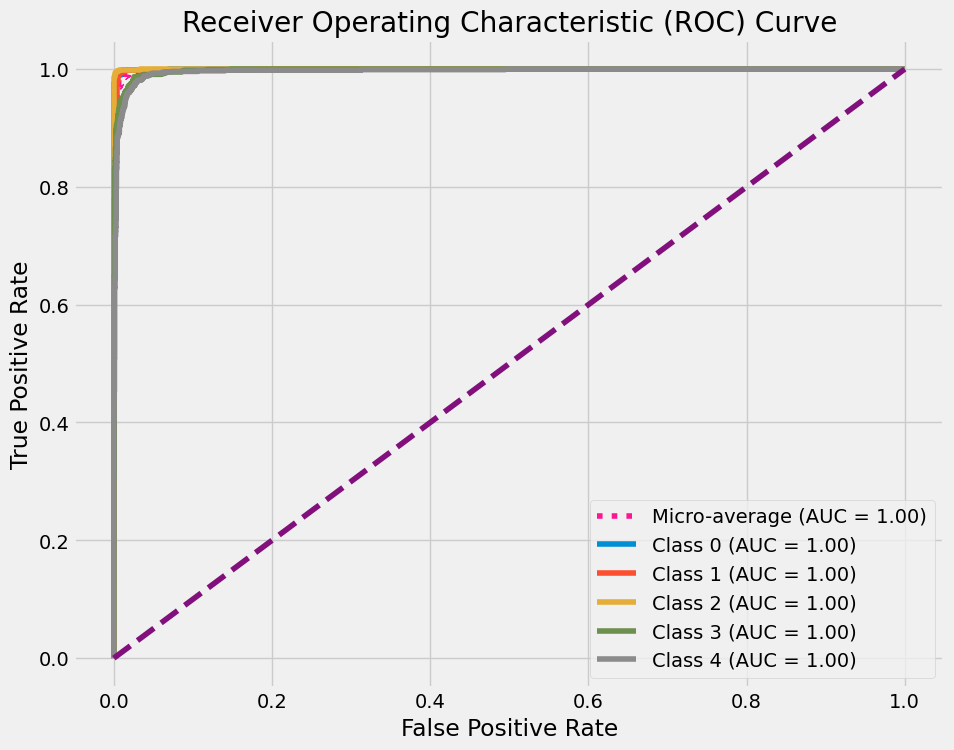

In [214]:
# Application of a filter of (6,6) in order to ensure that the model's current filtes is optimal and there is no need for bigger one
num_classes = 5
input_shape = (120, 120, 3)

def create_model_filter(input_shape, num_classes):
    model_filter = models.Sequential()
    model_filter.add(layers.Conv2D(128, (6, 6), padding='same', activation='relu', input_shape=input_shape))
    model_filter.add(layers.MaxPooling2D((2, 2)))
    model_filter.add(layers.Conv2D(256, (6, 6), padding='same', activation='relu'))
    model_filter.add(layers.MaxPooling2D((2, 2)))
    model_filter.add(layers.Conv2D(64, (6, 6), padding='same', activation='relu'))
    model_filter.add(layers.MaxPooling2D((2, 2)))
    model_filter.add(layers.Flatten())
    model_filter.add(layers.Dense(128, activation='relu'))
    model_filter.add(layers.Dense(32, activation='relu'))
    model_filter.add(layers.Dense(num_classes, activation='softmax'))
    return model_filter
epochs = 30
batch_size = 32
learning_rate = 0.0006

model_filter = create_model_filter(input_shape, num_classes)
optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)
model_filter.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
model_filter.summary()

history_filter = model_filter.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[early_stopping])
final_accuracy_filter = history_filter.history['val_accuracy'][-1]
print(f'Final Validation Accuracy: {final_accuracy_filter}')

test_loss_filter, test_accuracy_filter = model_filter.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss_filter}')
print(f'Test Accuracy: {test_accuracy_filter}')

generate_model_report(model=model_filter, history=history_filter, X_test=X_val, y_test=y_val, target_names=class_names)


Model Summary:
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 60, 60, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 60, 60, 64)        73792     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 30, 30, 64)        0         
 ng2D)                                                           
                                                                 
 flatten_8 (Flatten)         (None, 57600)             0         
                                                                 
 dense_24 (Dense)            (None, 128

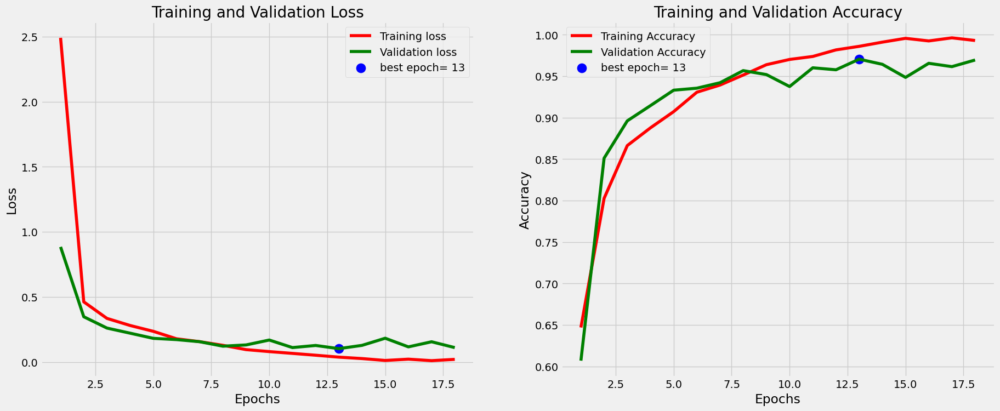


Evaluation Metrics:
157/157 [==============================] - 1s 4ms/step - loss: 0.6512 - accuracy: 0.7792
Test Loss: 0.6512
Test Accuracy: 0.7792

Classification Report:
157/157 [==============================] - 1s 3ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.68      0.91      0.78      1000
        Colon adenocarcinoma       0.83      0.57      0.68      1000
          Lung Benign Tissue       0.97      0.96      0.96      1000
Lung Squamous Cell Carcinoma       0.70      0.86      0.77      1000
         Lung adenocarcinoma       0.78      0.59      0.67      1000

                    accuracy                           0.78      5000
                   macro avg       0.79      0.78      0.77      5000
                weighted avg       0.79      0.78      0.77      5000


Confusion Matrix:


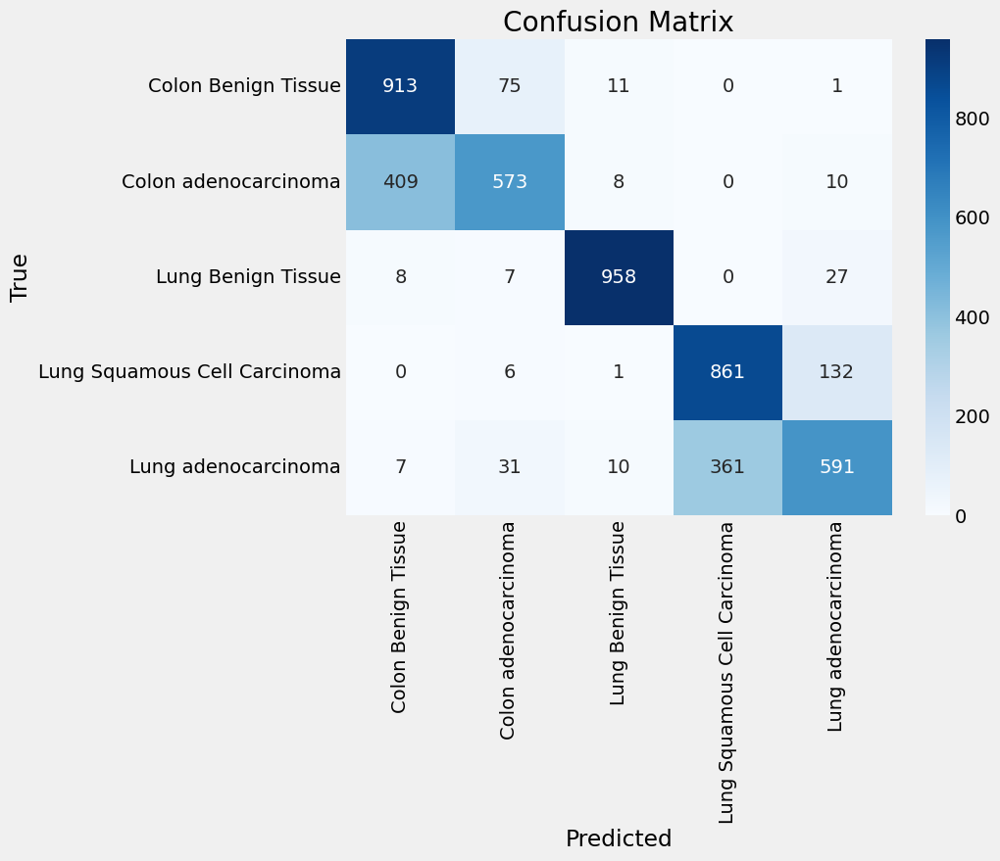

ROC
157/157 [==============================] - 0s 3ms/step


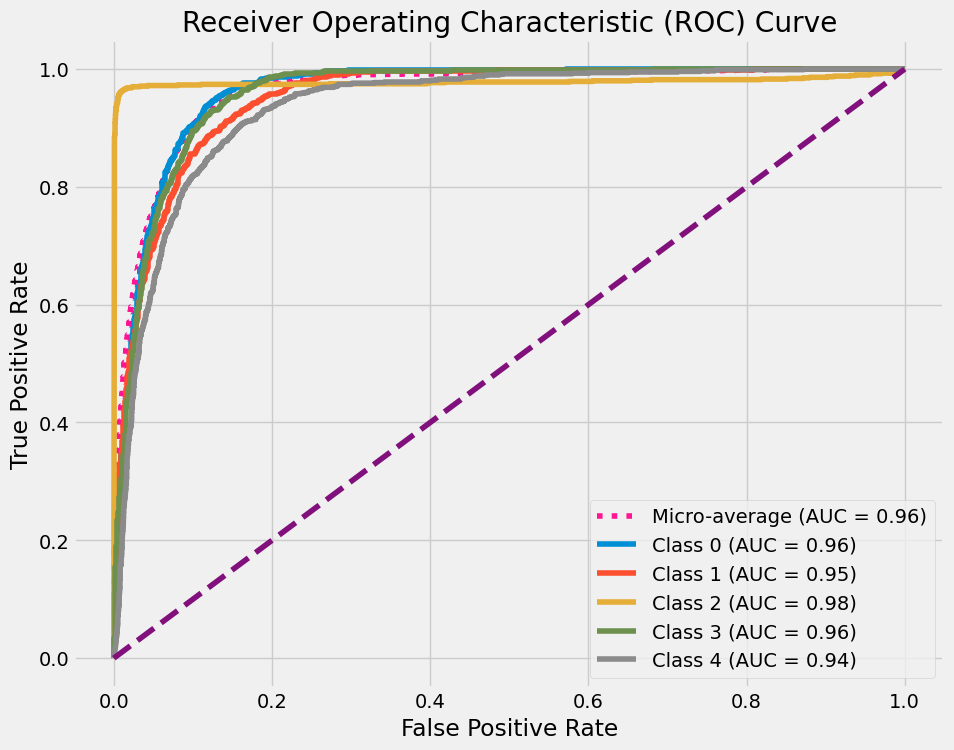

In [216]:
generate_model_report(model,history = history_filter, X_test=X_test, y_test=y_test, target_names=class_names)


# **Final Model**

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_143 (Conv2D)         (None, 120, 120, 128)     3584      
                                                                 
 max_pooling2d_143 (MaxPool  (None, 60, 60, 128)       0         
 ing2D)                                                          
                                                                 
 conv2d_144 (Conv2D)         (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_144 (MaxPool  (None, 30, 30, 256)       0         
 ing2D)                                                          
                                                                 
 conv2d_145 (Conv2D)         (None, 30, 30, 64)        147520    
                                                                 
 max_pooling2d_145 (MaxPool  (None, 15, 15, 64)      

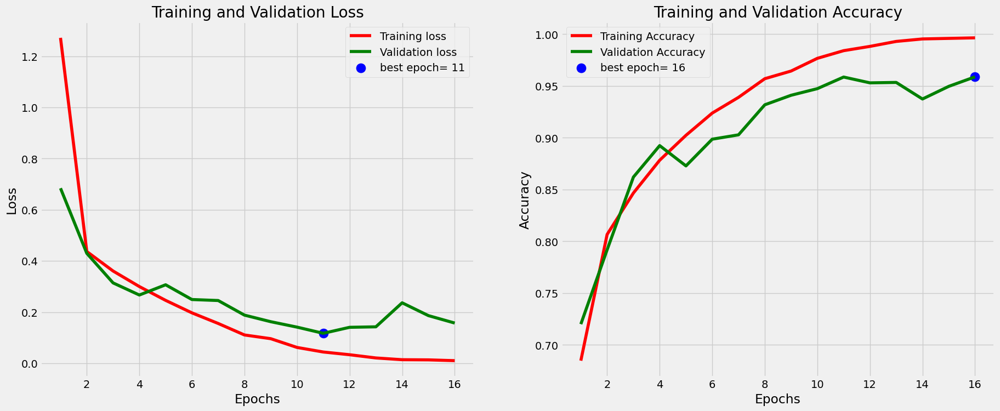


Evaluation Metrics:
157/157 [==============================] - 1s 6ms/step - loss: 0.1874 - accuracy: 0.9554
Test Loss: 0.1874
Test Accuracy: 0.9554

Classification Report:
157/157 [==============================] - 1s 5ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.97      0.96      0.96      1000
        Colon adenocarcinoma       0.95      0.96      0.96      1000
          Lung Benign Tissue       1.00      0.98      0.99      1000
Lung Squamous Cell Carcinoma       0.93      0.95      0.94      1000
         Lung adenocarcinoma       0.93      0.92      0.93      1000

                    accuracy                           0.96      5000
                   macro avg       0.96      0.96      0.96      5000
                weighted avg       0.96      0.96      0.96      5000


Confusion Matrix:


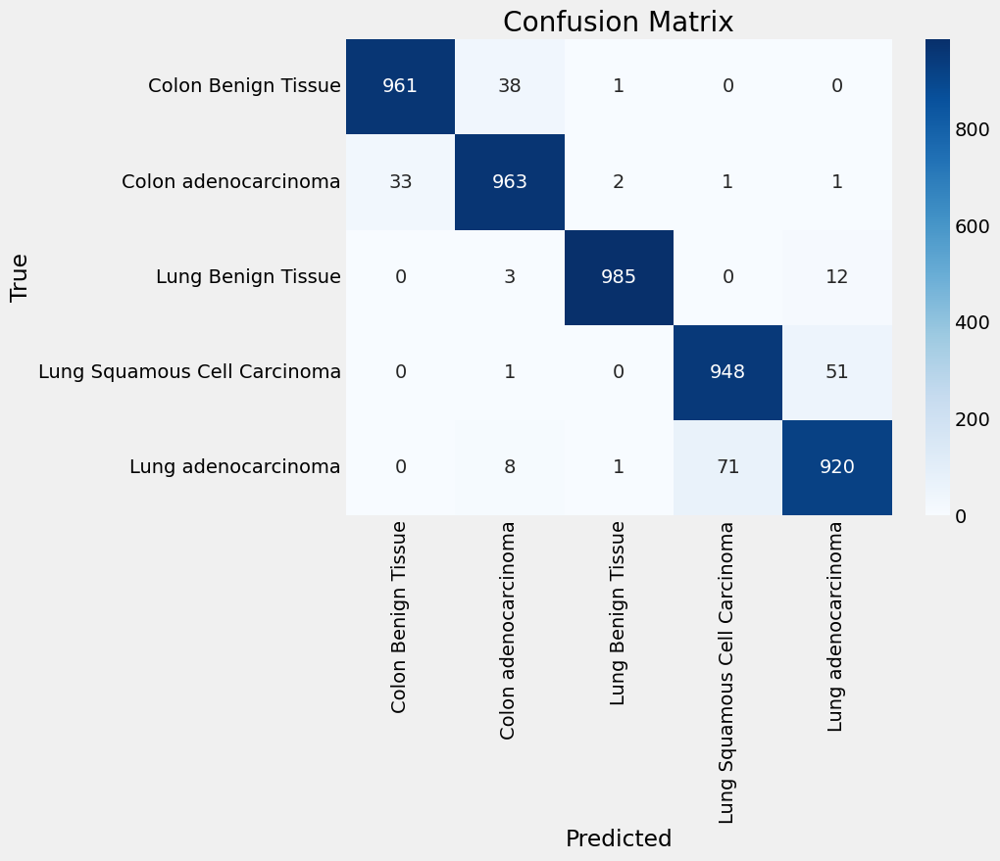

ROC
157/157 [==============================] - 1s 5ms/step


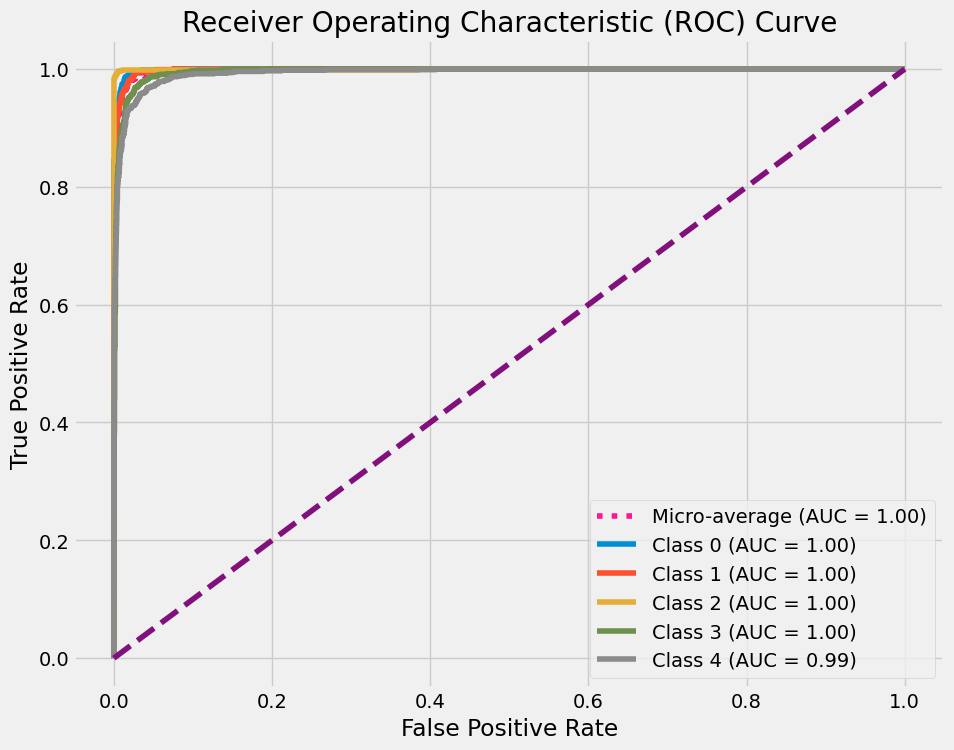

In [192]:
# Applying all the parameters and checkign the model on validation and test set for the report of the model
num_classes = 5
input_shape = (120, 120, 3)

def create_model_final(input_shape, num_classes):
    model_final = models.Sequential()
    model_final.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu', input_shape=input_shape))
    model_final.add(layers.MaxPooling2D((2, 2)))
    model_final.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model_final.add(layers.MaxPooling2D((2, 2)))
    model_final.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model_final.add(layers.MaxPooling2D((2, 2)))
    model_final.add(layers.Flatten())
    model_final.add(layers.Dense(128, activation='relu'))
    model_final.add(layers.Dense(32, activation='relu'))
    model_final.add(layers.Dense(num_classes, activation='softmax'))
    return model_final

epochs = 25
batch_size = 32
learning_rate = 0.0006

model_final = create_model_final(input_shape, num_classes)
optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)
model_final.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
model_final.summary()

history_final = model_final.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val), callbacks=[early_stopping])
final_accuracy_final = history_final.history['val_accuracy'][-1]
print(f'Final Validation Accuracy: {final_accuracy_final}')

test_loss_final, test_accuracy_final = model_final.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss_final}')
print(f'Test Accuracy: {test_accuracy_final}')

generate_model_report(model=model_final, history=history_final, X_test=X_test, y_test=y_test, target_names=class_names)


# Transfer Learning Model


In [7]:
# example of loading the vgg16 model
from keras.applications.vgg16 import VGG16
# load model
vgg_model = VGG16()
# summarize the model
vgg_model.summary()

553467096/553467096 [==============================] - 13s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

In [8]:
from keras.applications.vgg16 import VGG16
# load model without output layer and specify a new input shape for images
### PUT YOUR CODE HERE ###
vgg_model = VGG16(include_top=False, input_shape=(120, 120, 3))
### END ###

In [9]:
# mark loaded layers as not trainable
for layer in vgg_model.layers:
	layer.trainable = False

In [10]:
from tensorflow.keras import layers
from keras.models import Model

# add new classifier layers
# add flatten layer
flat1 = layers.Flatten()(vgg_model.layers[-1].output)
# add Dense layer
class1 = layers.Dense(128, activation='relu')(flat1)
# add output layer with softmax activation
output = layers.Dense(5, activation='softmax')(class1)  # 5 classes in your case
# define new model
vgg_model = Model(inputs=vgg_model.inputs, outputs=output)
# summarize
vgg_model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 120, 120, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 120, 120, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 60, 60, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 60, 60, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 60, 60, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 30, 30, 128)       0     

In [11]:
### PUT YOUR CODE HERE ###
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adamax

from tensorflow.keras.optimizers import legacy
learning_rate = 0.0006

optimizer = legacy.Adamax(learning_rate=learning_rate)

# compile model
vgg_model.compile(loss='categorical_crossentropy',optimizer=Adamax(learning_rate=learning_rate), metrics=['accuracy'])
# fit model
history = vgg_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, verbose=1)

### END ###

Epoch 1/20
469/469 [==============================] - 16s 25ms/step - loss: 0.6342 - accuracy: 0.8939 - val_loss: 0.3108 - val_accuracy: 0.9250
Epoch 2/20
469/469 [==============================] - 9s 20ms/step - loss: 0.1311 - accuracy: 0.9605 - val_loss: 0.2577 - val_accuracy: 0.9394
Epoch 3/20
469/469 [==============================] - 9s 20ms/step - loss: 0.0641 - accuracy: 0.9781 - val_loss: 0.2086 - val_accuracy: 0.9476
Epoch 4/20
469/469 [==============================] - 9s 20ms/step - loss: 0.0325 - accuracy: 0.9895 - val_loss: 0.1746 - val_accuracy: 0.9546
Epoch 5/20
469/469 [==============================] - 9s 20ms/step - loss: 0.0211 - accuracy: 0.9926 - val_loss: 0.2206 - val_accuracy: 0.9504
Epoch 6/20
469/469 [==============================] - 9s 20ms/step - loss: 0.0128 - accuracy: 0.9964 - val_loss: 0.1715 - val_accuracy: 0.9610
Epoch 7/20
469/469 [==============================] - 9s 20ms/step - loss: 0.0104 - accuracy: 0.9966 - val_loss: 0.1605 - val_accuracy: 0.962

Model Summary:
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 120, 120, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 120, 120, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 60, 60, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 60, 60, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 60, 60, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 30, 30, 12

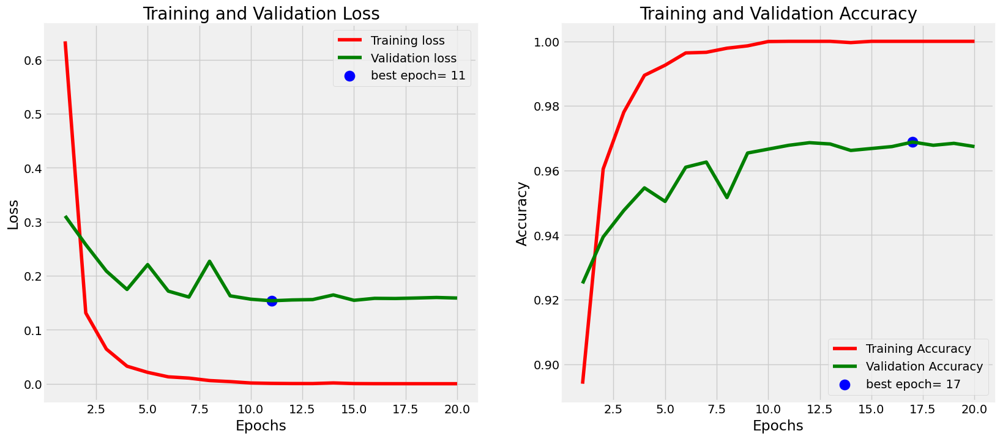


Evaluation Metrics:
157/157 [==============================] - 2s 15ms/step - loss: 0.1435 - accuracy: 0.9736
Test Loss: 0.1435
Test Accuracy: 0.9736

Classification Report:
157/157 [==============================] - 2s 13ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.99      0.98      0.99      1000
        Colon adenocarcinoma       0.98      0.98      0.98      1000
          Lung Benign Tissue       0.99      0.99      0.99      1000
Lung Squamous Cell Carcinoma       0.96      0.96      0.96      1000
         Lung adenocarcinoma       0.94      0.95      0.95      1000

                    accuracy                           0.97      5000
                   macro avg       0.97      0.97      0.97      5000
                weighted avg       0.97      0.97      0.97      5000


Confusion Matrix:


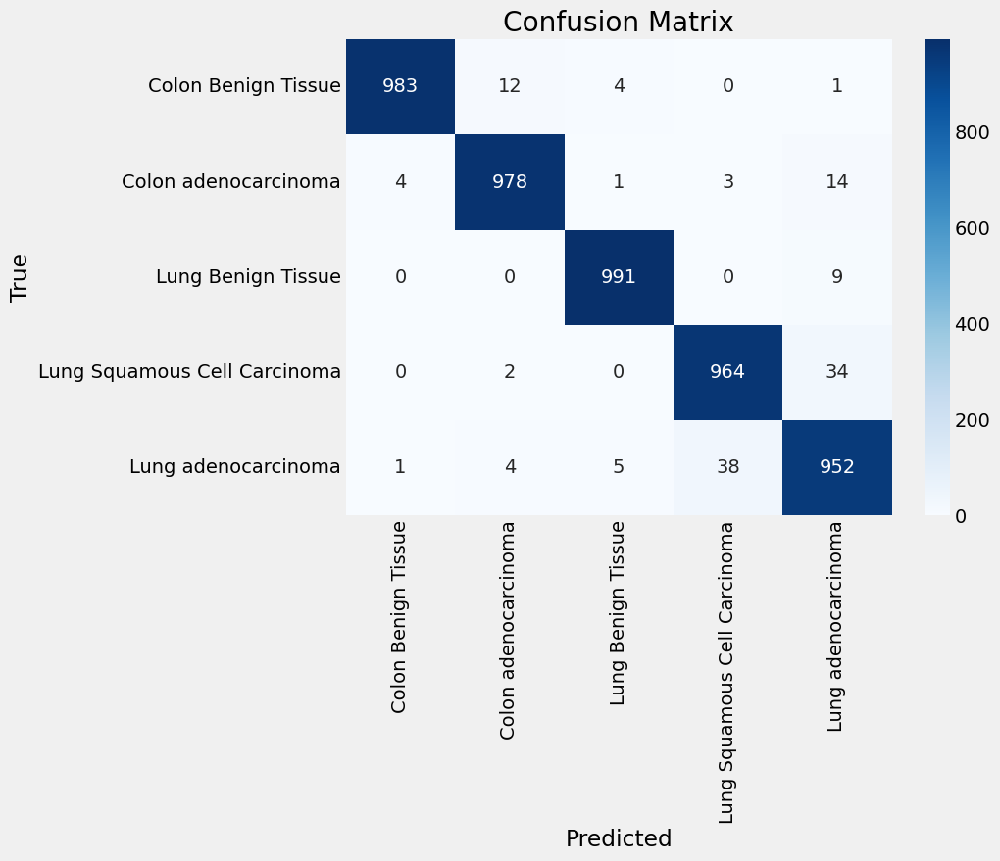

ROC
157/157 [==============================] - 2s 13ms/step


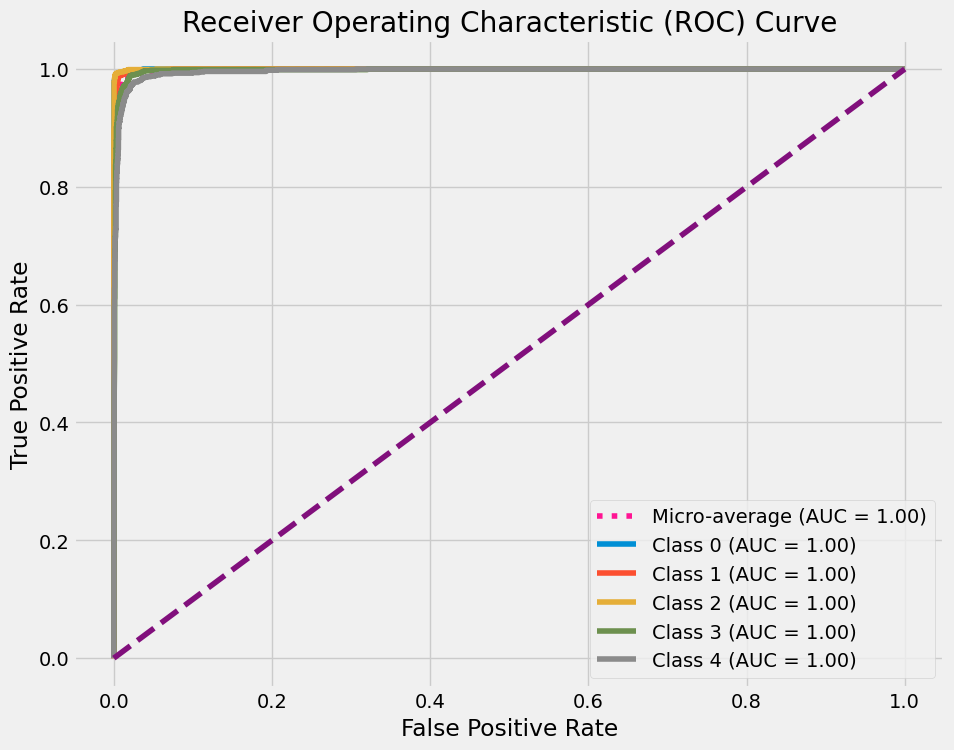

In [18]:
generate_model_report(vgg_model,history = history, X_test=X_test, y_test=y_test, target_names=class_names)


# **Enhanced model from literature**

In [18]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Create a Sequential model
model = Sequential()

# Input Layer
model.add(Conv2D(32, (3, 3), strides=(2, 2), padding='same', activation='relu', input_shape=(120, 120, 3)))

# Convolution Layers
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu'))

# Pooling Layers
model.add(MaxPooling2D(pool_size=(2, 2), padding='valid'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='valid'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='valid'))

# Flatten Layer
model.add(Flatten())

# Fully Connected Layers
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))  # Dropout Layer
model.add(Dense(5, activation='softmax'))  # Output layer with 5 neurons for 5 input classes

# Compile the model
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Define batch size and number of epochs
batch_size = 32
epochs = 100

# Train the model
history=model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_val, y_val))


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 60, 60, 32)        896       
                                                                 
 conv2d_4 (Conv2D)           (None, 30, 30, 64)        18496     
                                                                 
 conv2d_5 (Conv2D)           (None, 15, 15, 64)        36928     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 7, 7, 64)          0         
 g2D)                                                            
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 3, 3, 64)          0         
 g2D)                                                            
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 1, 1, 64)         

Model Summary:
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 60, 60, 32)        896       
                                                                 
 conv2d_4 (Conv2D)           (None, 30, 30, 64)        18496     
                                                                 
 conv2d_5 (Conv2D)           (None, 15, 15, 64)        36928     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 7, 7, 64)          0         
 g2D)                                                            
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 3, 3, 64)          0         
 g2D)                                                            
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 1, 

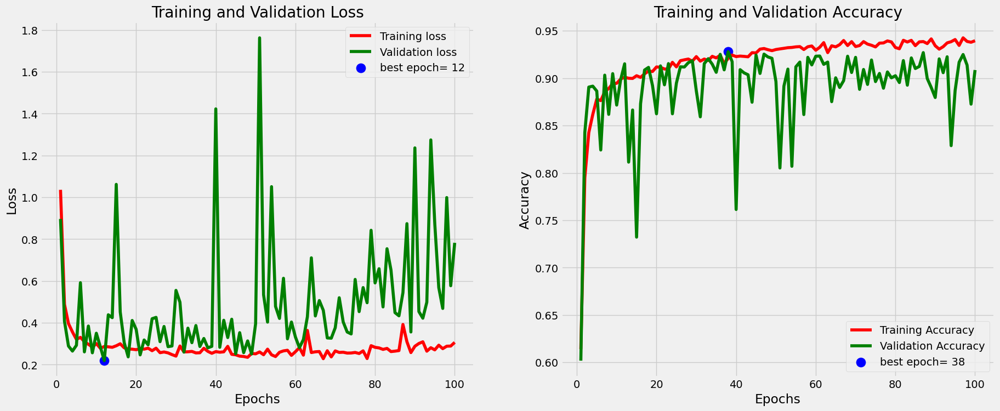


Evaluation Metrics:
157/157 [==============================] - 0s 3ms/step - loss: 0.7024 - accuracy: 0.9122
Test Loss: 0.7024
Test Accuracy: 0.9122

Classification Report:
157/157 [==============================] - 0s 2ms/step
                              precision    recall  f1-score   support

         Colon Benign Tissue       0.93      0.97      0.95      1000
        Colon adenocarcinoma       0.96      0.92      0.94      1000
          Lung Benign Tissue       0.96      1.00      0.98      1000
Lung Squamous Cell Carcinoma       0.92      0.77      0.84      1000
         Lung adenocarcinoma       0.80      0.89      0.85      1000

                    accuracy                           0.91      5000
                   macro avg       0.91      0.91      0.91      5000
                weighted avg       0.91      0.91      0.91      5000


Confusion Matrix:


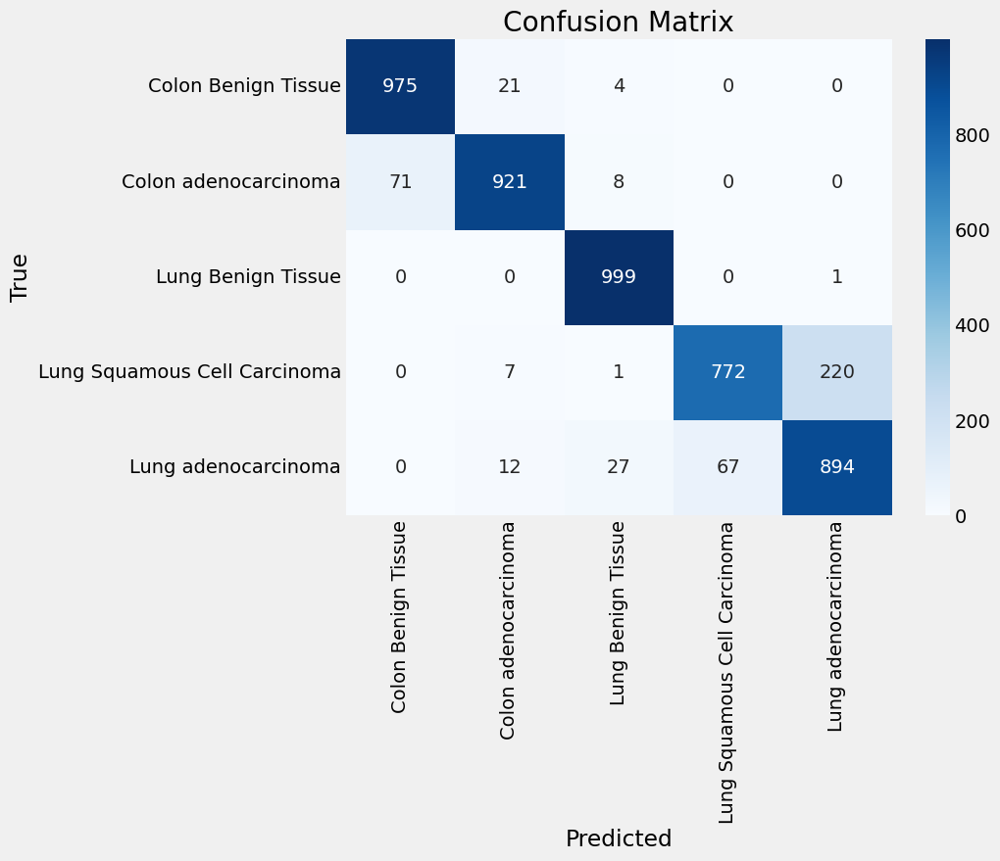

ROC
157/157 [==============================] - 0s 2ms/step


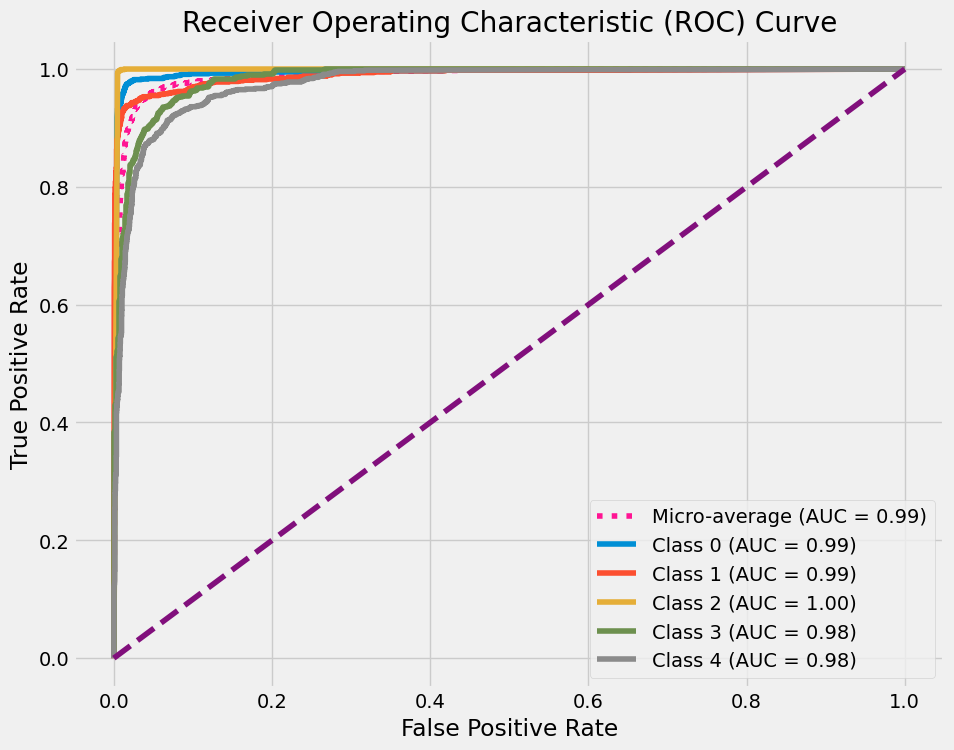

In [20]:
generate_model_report(model,history = history, X_test=X_test, y_test=y_test, target_names=class_names)


In [21]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

157/157 [==============================] - 0s 3ms/step - loss: 0.7024 - accuracy: 0.9122
Test Loss: 0.7024
Test Accuracy: 0.9122
